In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with measurement noise added, and with an order of magnitue improvement in measurement capabilities (IP=10) (simulation=6)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['0','0','0','1','0']
improvement_factor=10
effect_strength=1
chance_companion=0.01
remove_likely_binaries='0'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


265.61 0.0038


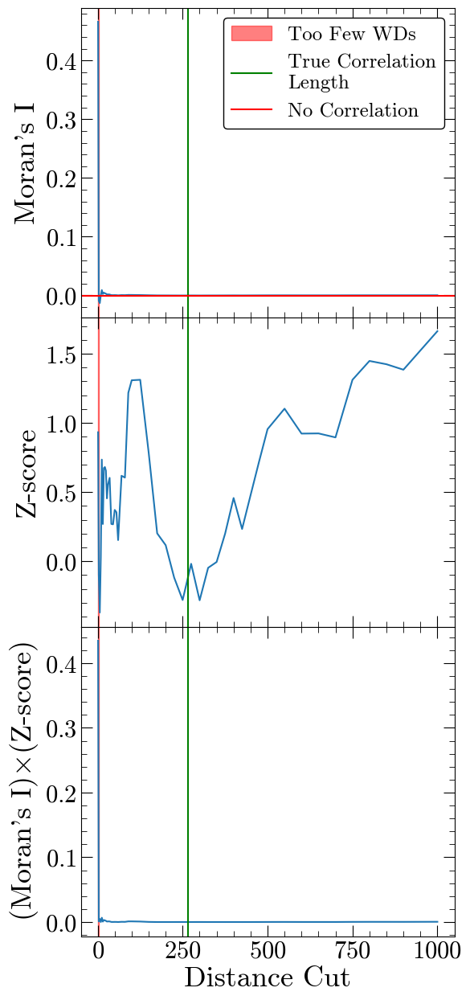

673.42 2.6e-09


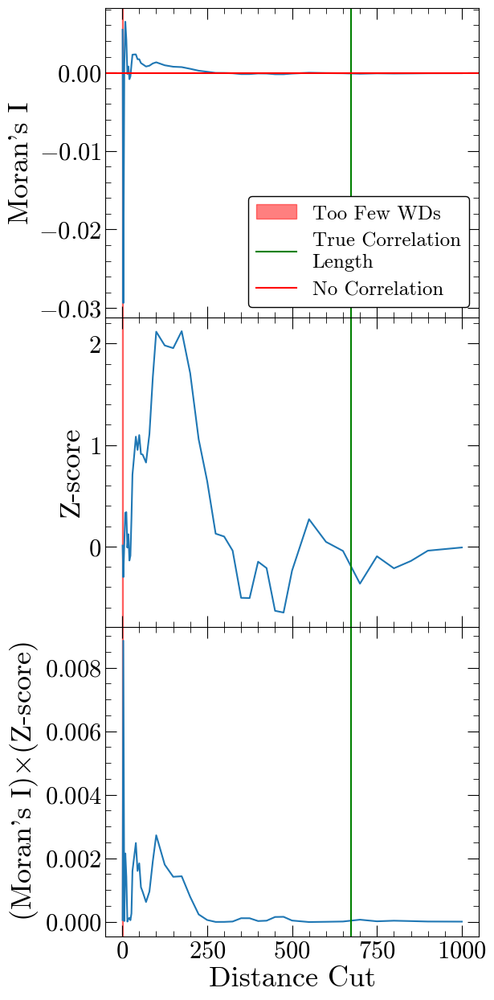

253.54 4.8e-05


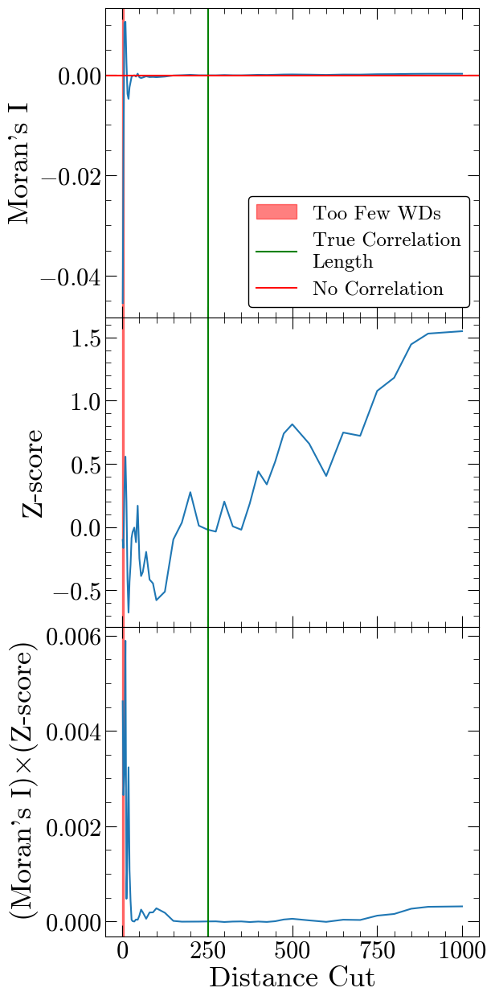

61.21 0.1


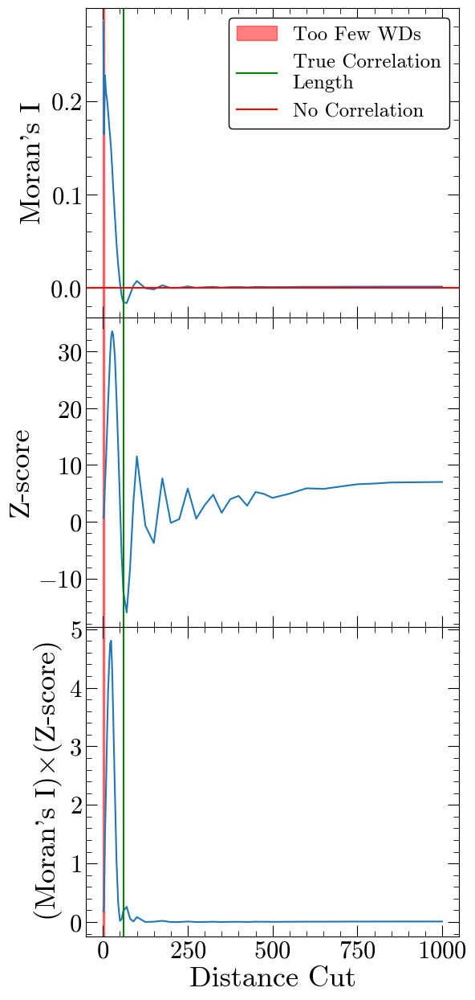

57.86 1.6e-05


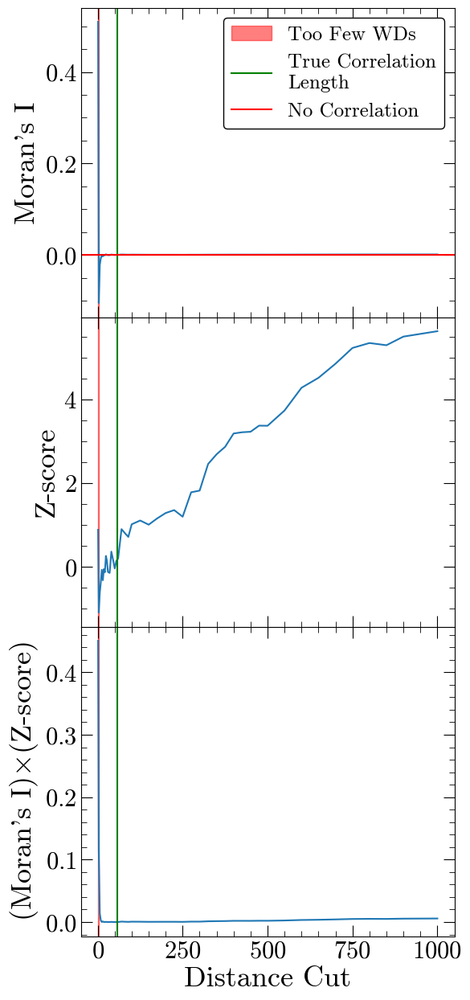

453.49 6.2e-07


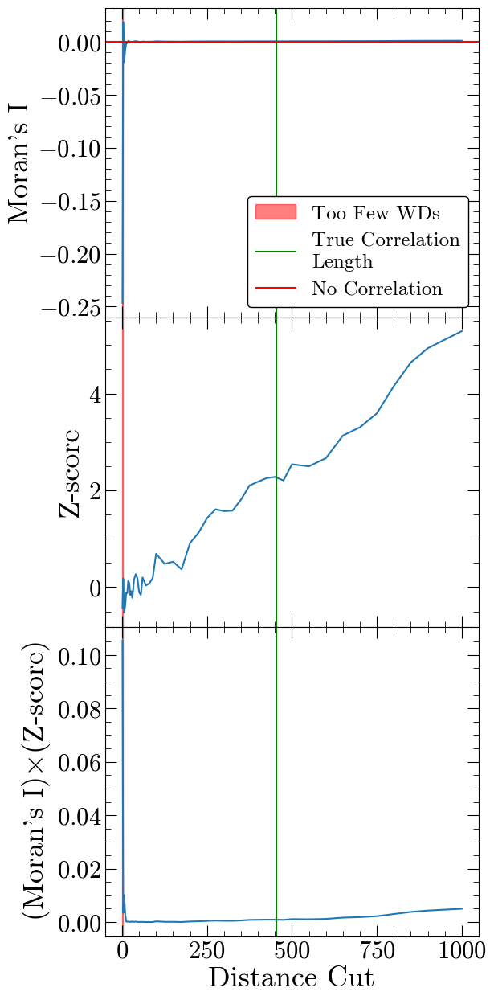

31.1 2.6e-09


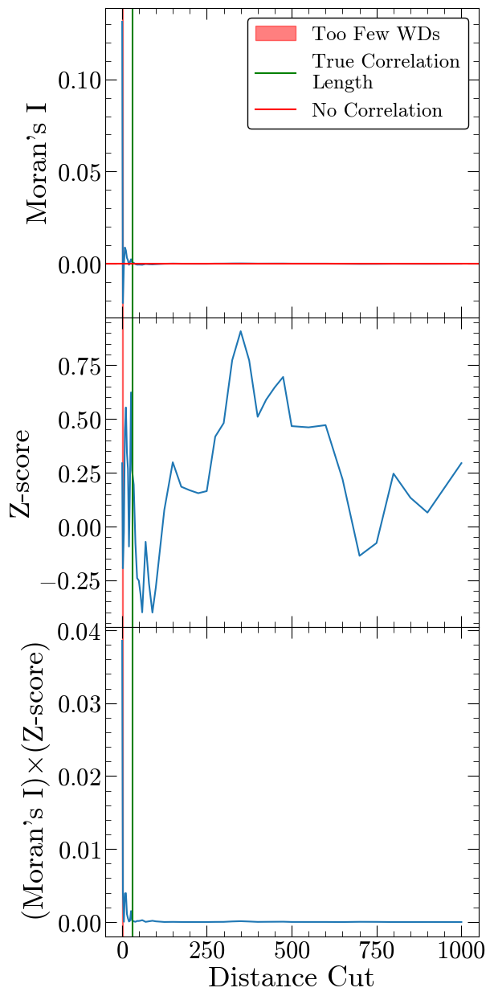

403.7 0.1


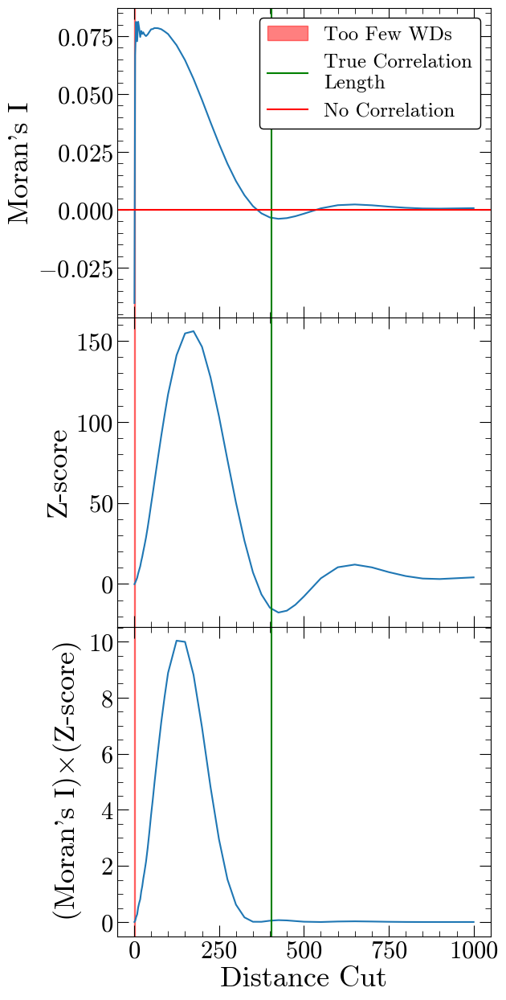

599.48 1e-10


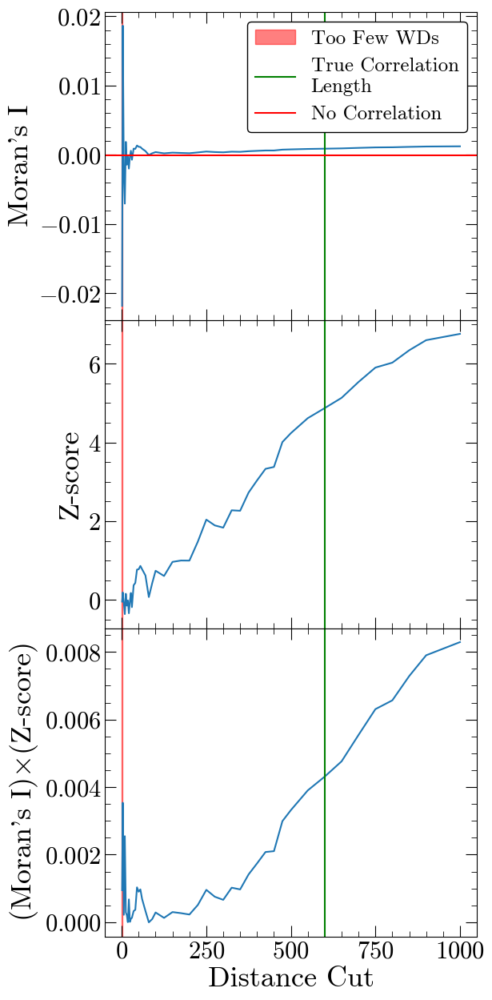

81.28 0.37


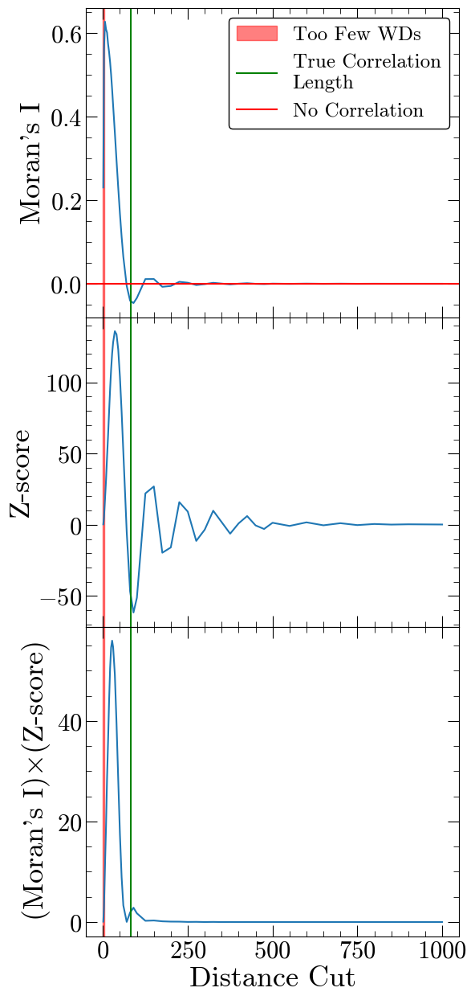

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

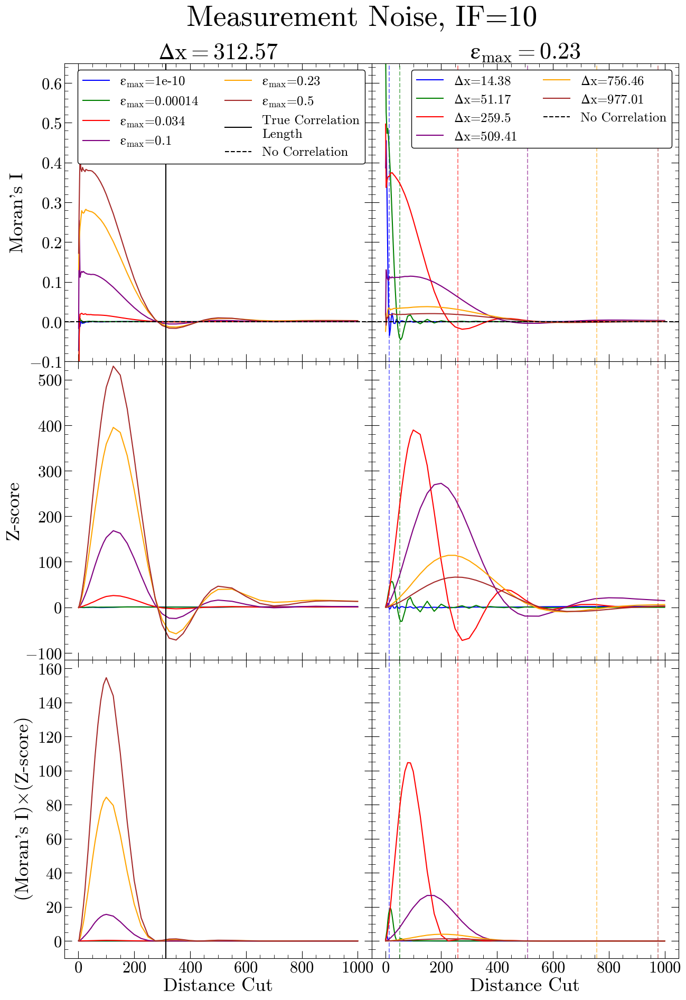

In [8]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.034,0.1,0.23,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.23
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.1,0.65)
ax4.set_ylim(-0.1,0.65)

ax2.set_ylim(-115,540)
ax5.set_ylim(-115,540)

ax3.set_ylim(-10,165)
ax6.set_ylim(-10,165)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('Measurement Noise, IF=10', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_measurement_noise10.pdf', dpi=300)#, pad_inches=0.3)

(-0.02, 3.0)

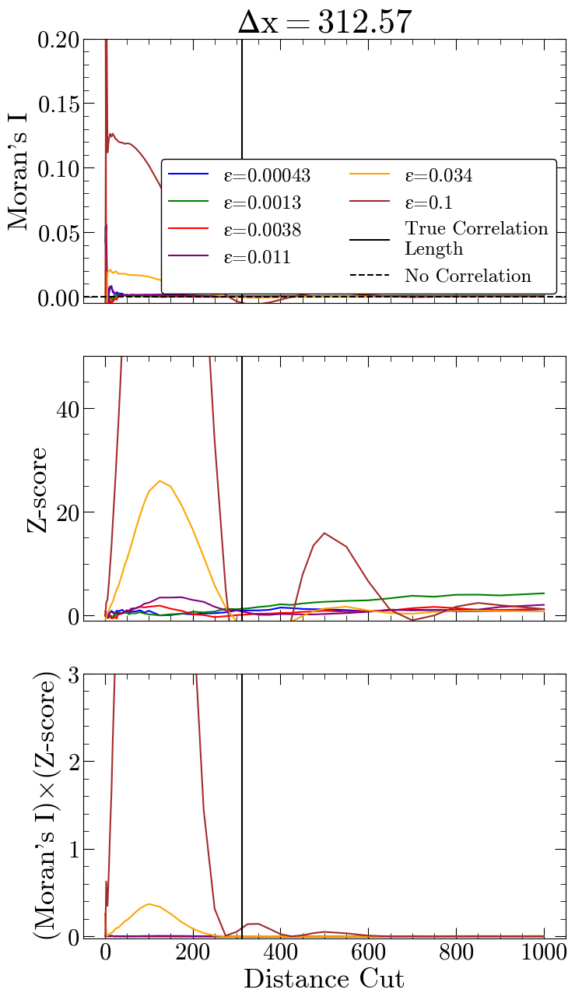

In [27]:
#find minimum visible epsilon

#min=0.034
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[0.00043,0.0013,0.0038,0.011,0.034,0.1]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='lower right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    

#clean up the plot
ax1.set_ylim(-0.005,0.2)

ax2.set_ylim(-1,50)

ax3.set_ylim(-.02,3)


# Set up the training and testing data for the CNN

In [9]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [10]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [30]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [31]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [32]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [46]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 1s 4ms/step - loss: 118071.0156
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 66223.6172
Epoch 3/100
92/92 [==============================] - 0s 5ms/step - loss: 63731.5156
Epoch 4/100
92/92 [==============================] - 0s 5ms/step - loss: 61002.4531
Epoch 5/100
92/92 [==============================] - 0s 5ms/step - loss: 58687.7539
Epoch 6/100
92/92 [==============================] - 0s 5ms/step - loss: 57573.3125
Epoch 7/100
92/92 [==============================] - 0s 5ms/step - loss: 57217.2227
Epoch 8/100
92/92 [==============================] - 0s 5ms/step - loss: 56908.6328
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 56759.0000
Epoch 10/100
92/92 [==============================] - 0s 5ms/step - loss: 56571.6172
Epoch 11/100
92/92 [==============================] - 0s 5ms/step - loss: 56632.7109
Epoch 12/100
92/92 [==============================] - 0s 5ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 234.382 pc
MAE: 151.249 pc
BIAS: -17.041 pc
MED FRAC ERR: 0.529 

Training Stats, Successful Fits
Frac Success Fit: 0.217 
RMSE: 18.056 pc
MAE: 8.033 pc
BIAS: 0.888 pc
MED FRAC ERR: 0.031 

Testing Stats
RMSE: 220.677 pc
MAE: 53.755 pc
BIAS: -2.238 pc
MED FRAC ERR: 0.134 

Testing Stats, Successful Fits
Frac Success Fit: 0.473 
RMSE: 24.061 pc
MAE: 7.260 pc
BIAS: 1.115 pc
MED FRAC ERR: 0.031 


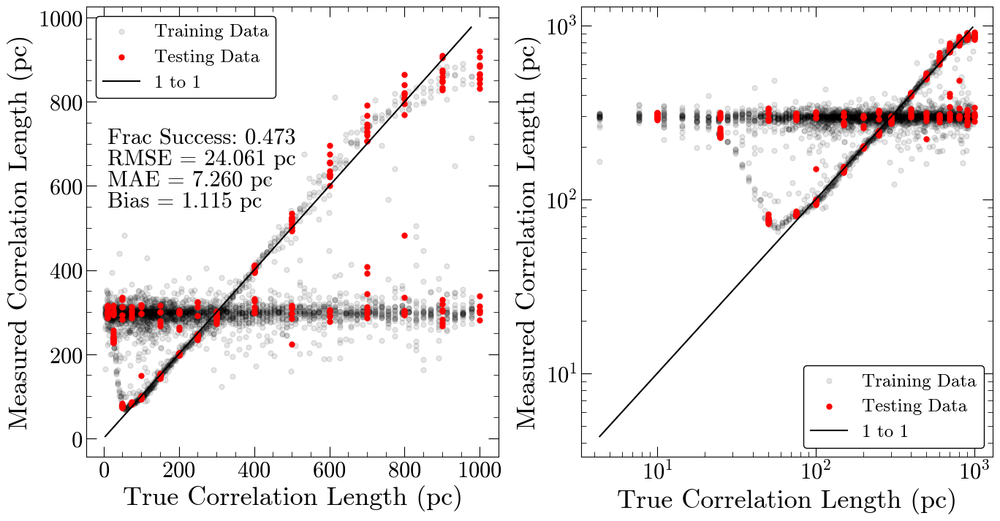

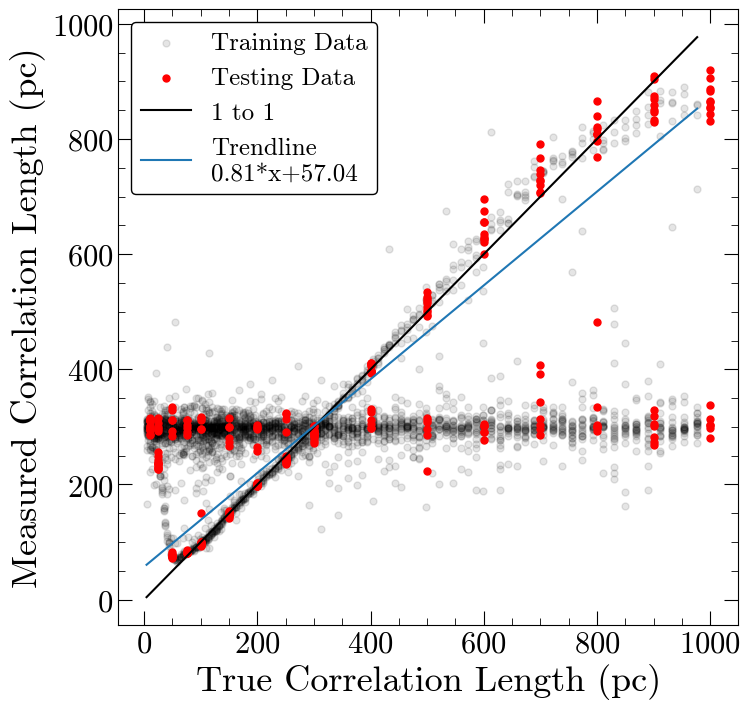

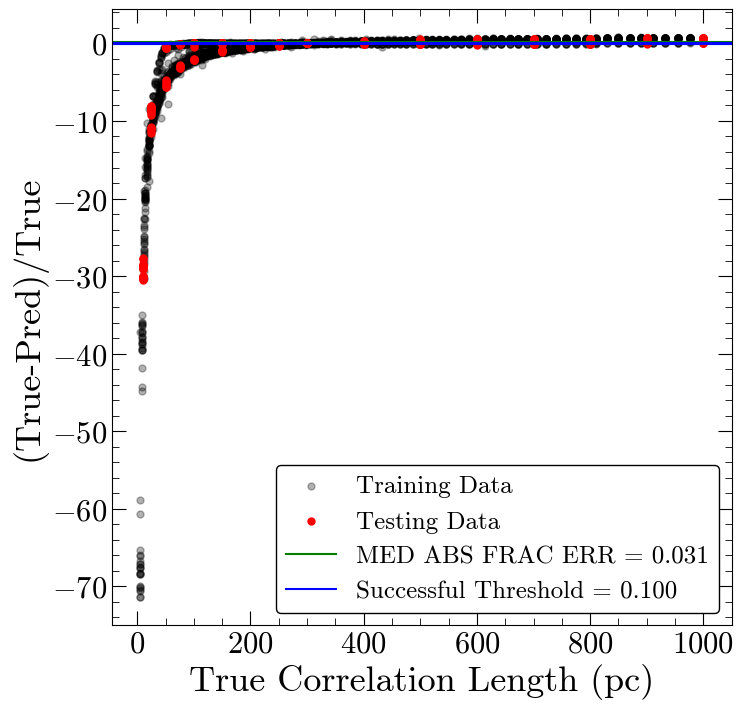

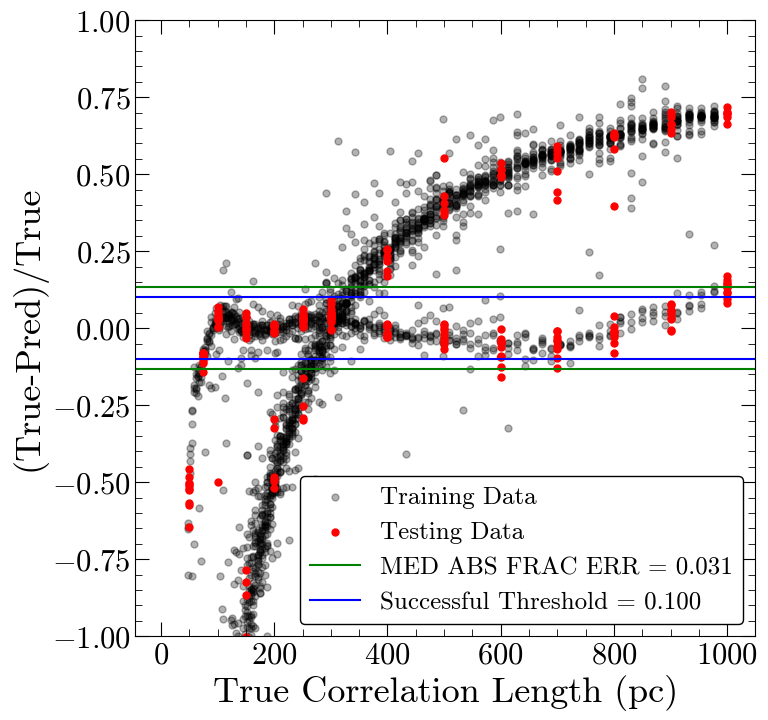

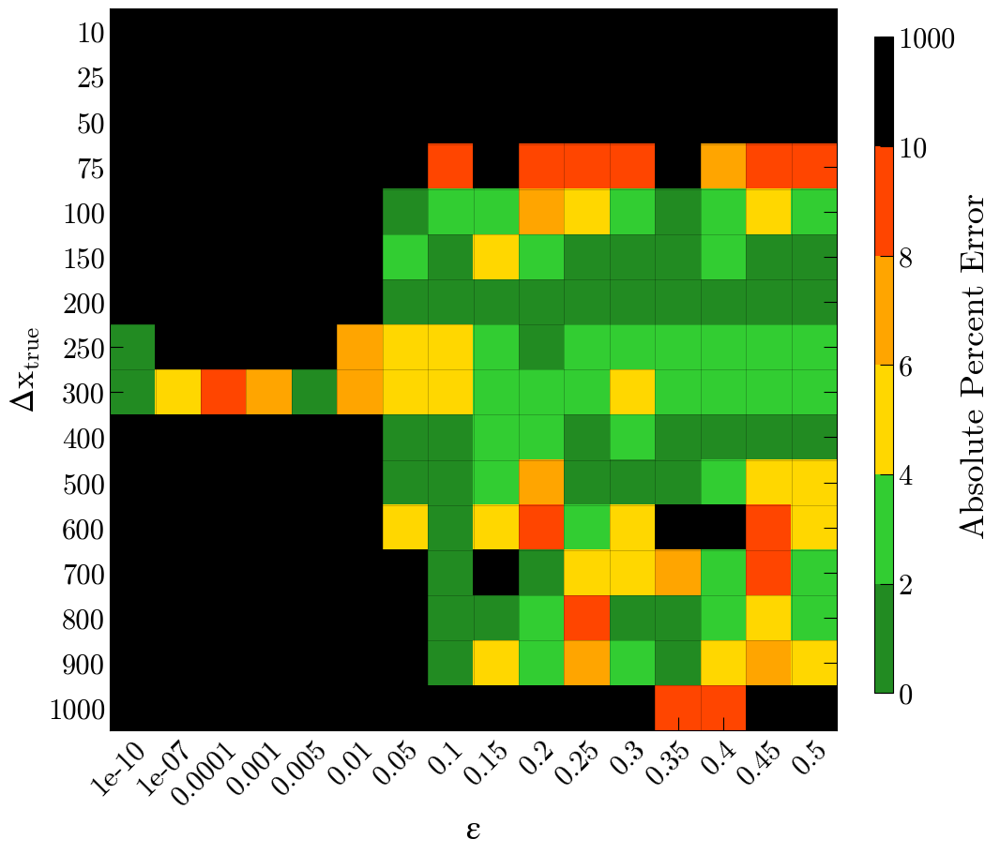

Number of squares with abs percent err>10%,  135


In [34]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 1s 7ms/step - loss: 117357.8438
Epoch 2/200
92/92 [==============================] - 1s 5ms/step - loss: 66614.8984
Epoch 3/200
92/92 [==============================] - 0s 5ms/step - loss: 64300.8633
Epoch 4/200
92/92 [==============================] - 0s 5ms/step - loss: 62134.2344
Epoch 5/200
92/92 [==============================] - 1s 6ms/step - loss: 59682.9258
Epoch 6/200
92/92 [==============================] - 1s 6ms/step - loss: 58315.4883
Epoch 7/200
92/92 [==============================] - 1s 7ms/step - loss: 58098.9727
Epoch 8/200
92/92 [==============================] - 1s 9ms/step - loss: 57723.4102
Epoch 9/200
92/92 [==============================] - 1s 8ms/step - loss: 57277.9844
Epoch 10/200
92/92 [==============================] - 1s 8ms/step - loss: 57132.0000
Epoch 11/200
92/92 [==============================] - 1s 9ms/step - loss: 56767.5820
Epoch 12/200
92/92 [==============================] - 1s 8ms/step - loss:

92/92 [==============================] - 1s 8ms/step - loss: 54620.3789
Epoch 193/200
92/92 [==============================] - 1s 7ms/step - loss: 54611.1445
Epoch 194/200
92/92 [==============================] - 1s 7ms/step - loss: 54494.9219
Epoch 195/200
92/92 [==============================] - 1s 7ms/step - loss: 54473.7070
Epoch 196/200
92/92 [==============================] - 1s 7ms/step - loss: 54488.9375
Epoch 197/200
92/92 [==============================] - 1s 6ms/step - loss: 54620.5391
Epoch 198/200
92/92 [==============================] - 1s 7ms/step - loss: 54620.5859
Epoch 199/200
92/92 [==============================] - 1s 7ms/step - loss: 54630.8086
Epoch 200/200
92/92 [==============================] - 1s 8ms/step - loss: 54576.2188

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 233.170 pc
MAE: 153.429 pc
BIAS: -6.954 pc
MED FRAC ERR: 0.521 

Training Stats, Successful Fits
Frac Success Fit: 0.205 
RMSE: 18.125 pc
MAE: 11.860 pc
BIAS: 9.097 pc
MED FRAC ERR: 0.047 

Testing Stats
RMSE: 217.919 pc
MAE: 42.315 pc
BIAS: 10.388 pc
MED FRAC ERR: 0.104 

Testing Stats, Successful Fits
Frac Success Fit: 0.492 
RMSE: 24.076 pc
MAE: 14.442 pc
BIAS: 12.492 pc
MED FRAC ERR: 0.047 


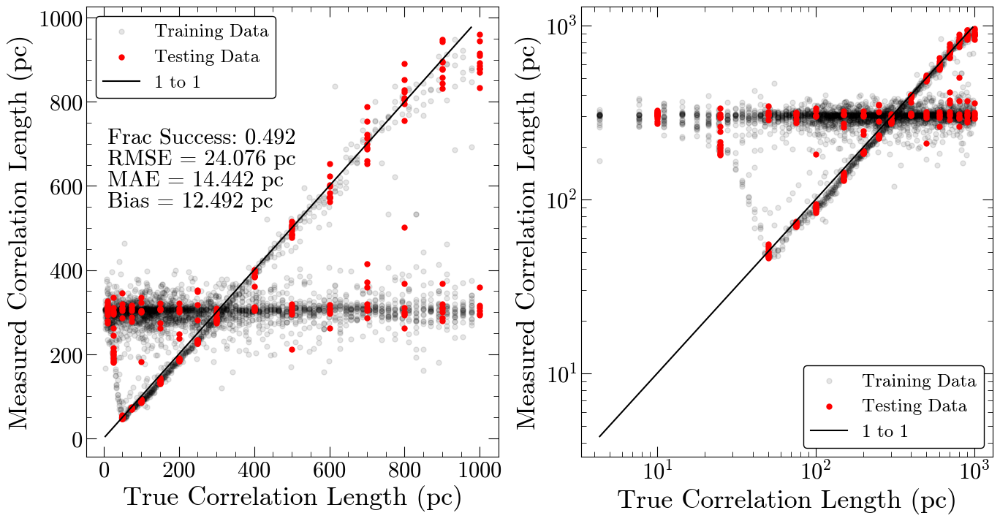

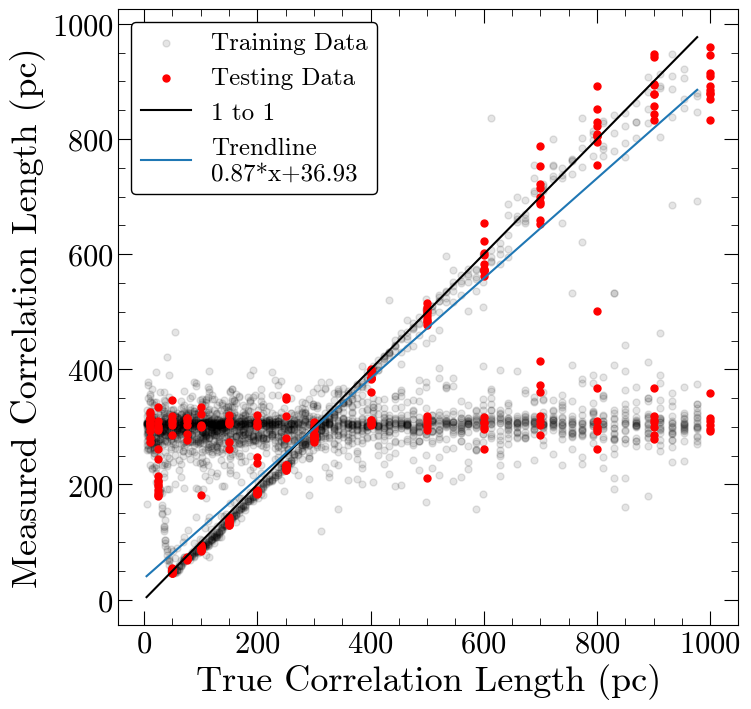

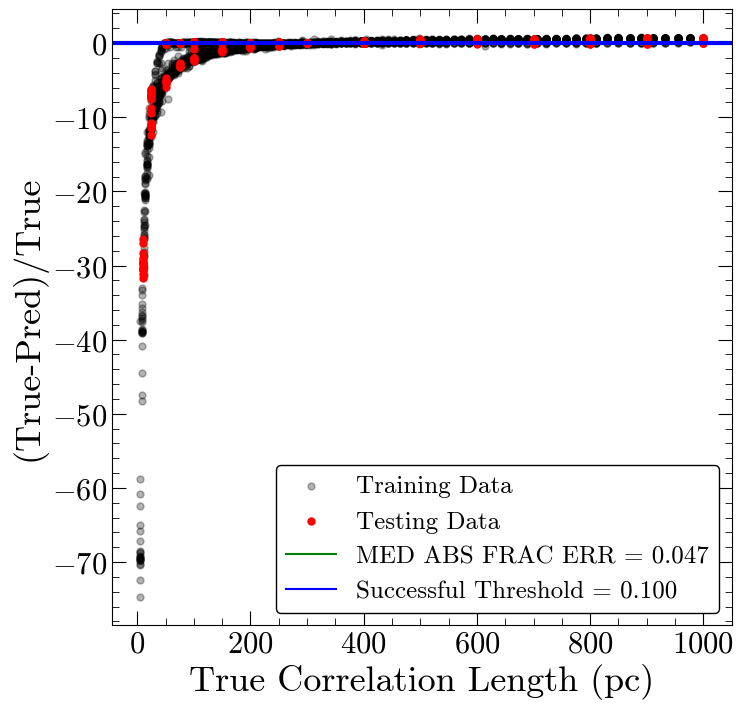

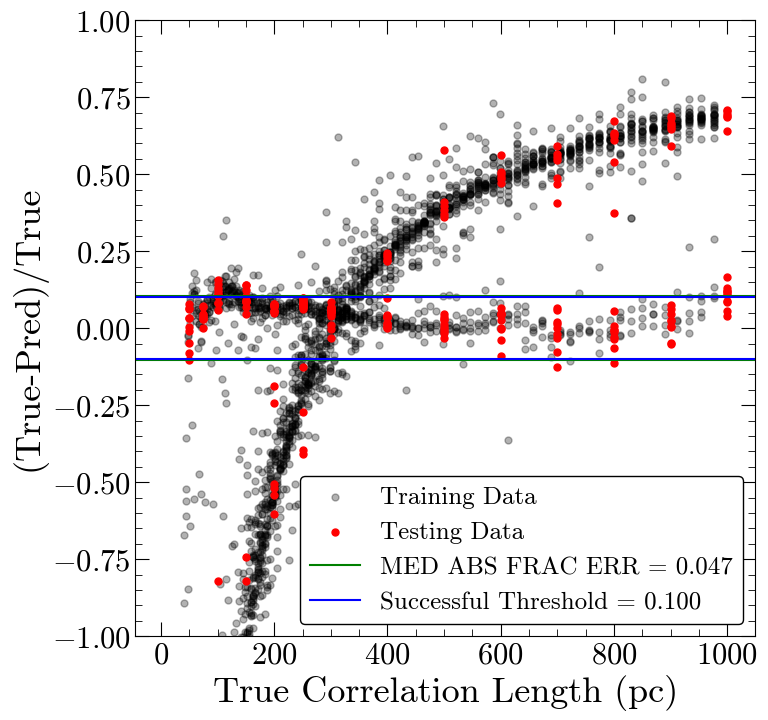

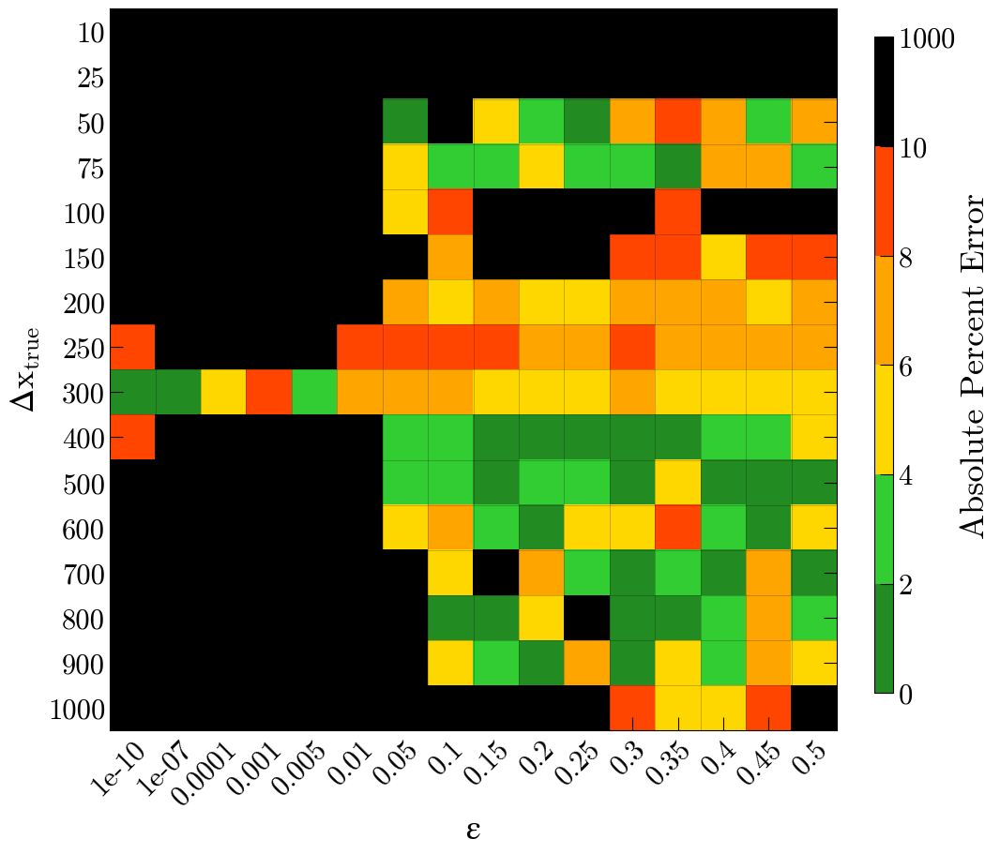

Number of squares with abs percent err>10%,  130


In [35]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 13ms/step - loss: 102108.8203
Epoch 2/100
92/92 [==============================] - 1s 12ms/step - loss: 66193.3125
Epoch 3/100
92/92 [==============================] - 1s 12ms/step - loss: 62885.5547
Epoch 4/100
92/92 [==============================] - 1s 12ms/step - loss: 60123.9141
Epoch 5/100
92/92 [==============================] - 1s 10ms/step - loss: 58893.1016
Epoch 6/100
92/92 [==============================] - 1s 10ms/step - loss: 58093.0469
Epoch 7/100
92/92 [==============================] - 1s 9ms/step - loss: 57780.7539
Epoch 8/100
92/92 [==============================] - 1s 11ms/step - loss: 57463.5469
Epoch 9/100
92/92 [==============================] - 1s 11ms/step - loss: 57549.8984
Epoch 10/100
92/92 [==============================] - 1s 11ms/step - loss: 57451.4766
Epoch 11/100
92/92 [==============================] - 1s 9ms/step - loss: 57355.6953
Epoch 12/100
92/92 [==============================] - 1s 11ms/st

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 233.505 pc
MAE: 162.095 pc
BIAS: -49.698 pc
MED FRAC ERR: 0.516 

Training Stats, Successful Fits
Frac Success Fit: 0.179 
RMSE: 22.658 pc
MAE: 15.679 pc
BIAS: -10.261 pc
MED FRAC ERR: 0.062 

Testing Stats
RMSE: 218.237 pc
MAE: 79.649 pc
BIAS: -23.524 pc
MED FRAC ERR: 0.153 

Testing Stats, Successful Fits
Frac Success Fit: 0.387 
RMSE: 27.112 pc
MAE: 18.485 pc
BIAS: -17.875 pc
MED FRAC ERR: 0.068 


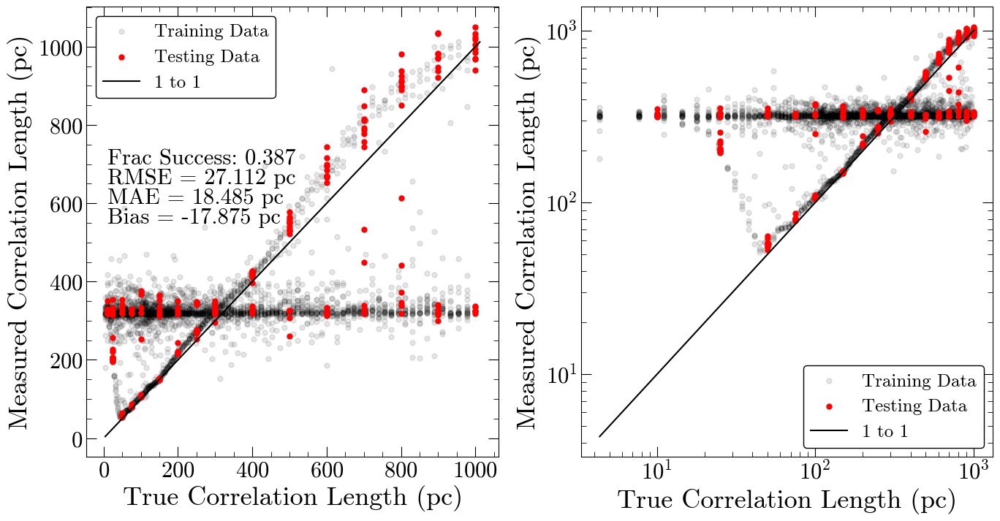

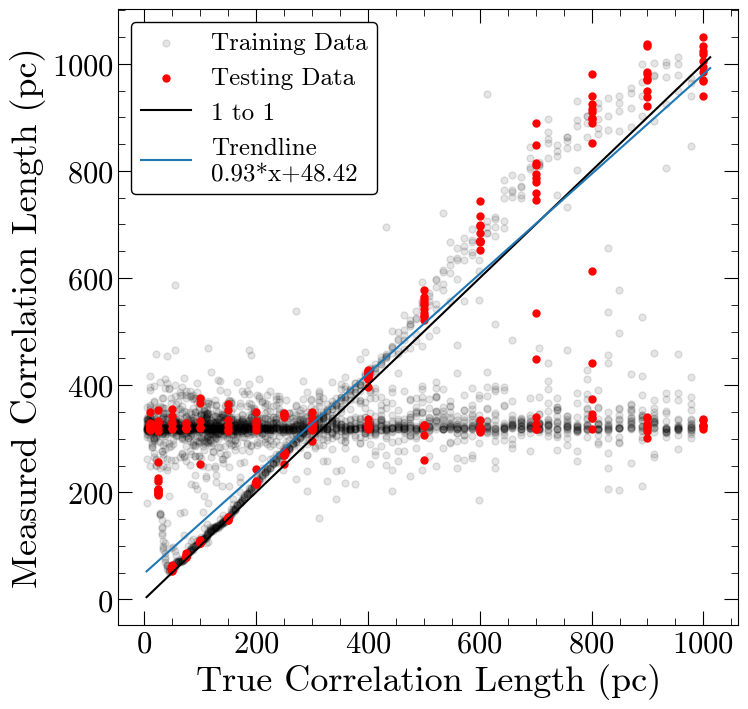

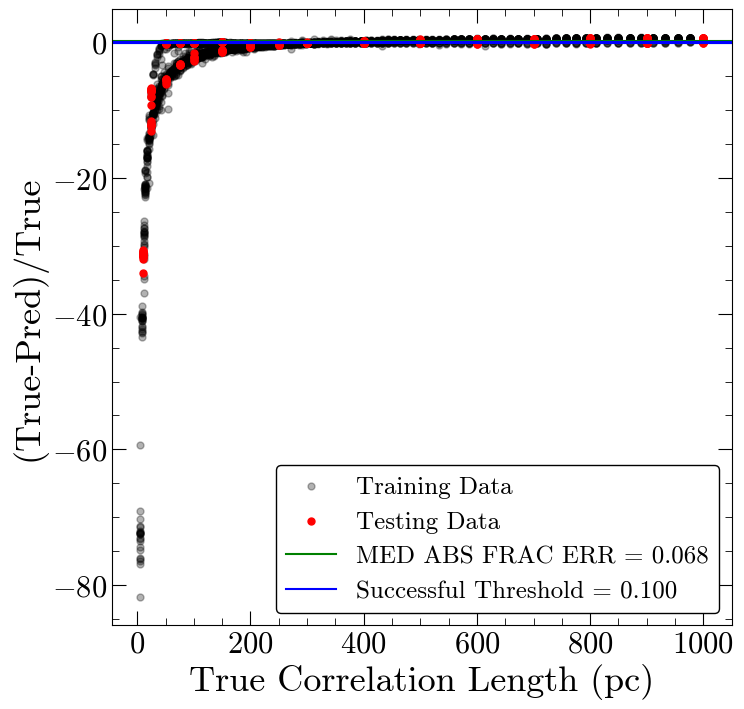

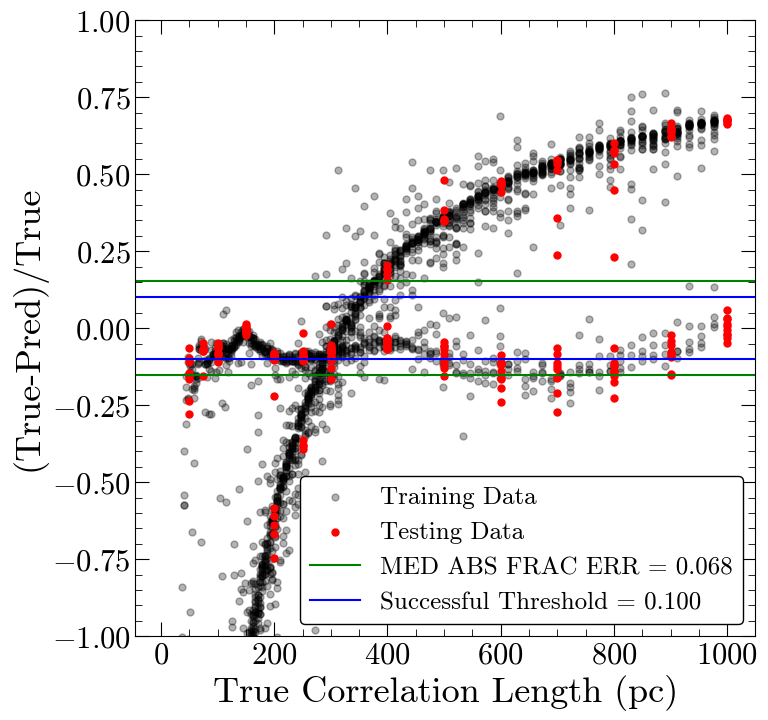

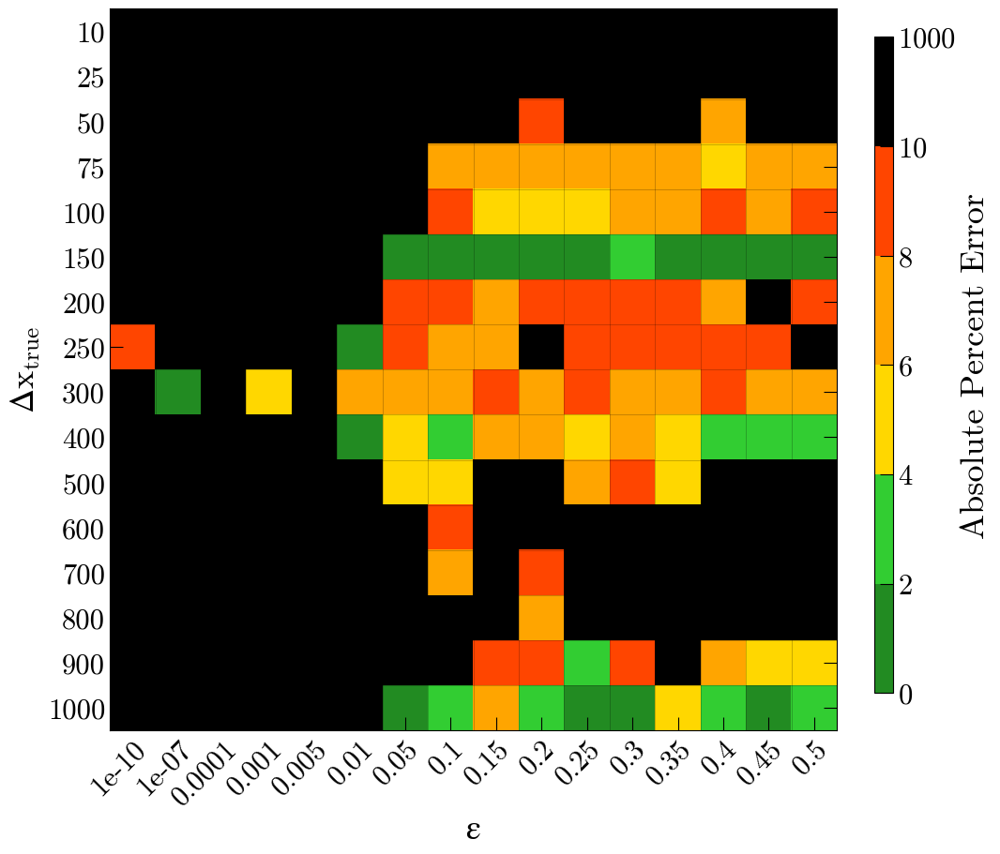

Number of squares with abs percent err>10%,  157


In [36]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 2s 10ms/step - loss: 102103.8594
Epoch 2/200
92/92 [==============================] - 1s 9ms/step - loss: 65291.6719
Epoch 3/200
92/92 [==============================] - 1s 10ms/step - loss: 62710.3438
Epoch 4/200
92/92 [==============================] - 1s 9ms/step - loss: 60879.3281
Epoch 5/200
92/92 [==============================] - 1s 9ms/step - loss: 59196.4727
Epoch 6/200
92/92 [==============================] - 1s 10ms/step - loss: 58289.9492
Epoch 7/200
92/92 [==============================] - 1s 9ms/step - loss: 58119.1484
Epoch 8/200
92/92 [==============================] - 1s 10ms/step - loss: 57364.6719
Epoch 9/200
92/92 [==============================] - 1s 10ms/step - loss: 57111.3125
Epoch 10/200
92/92 [==============================] - 1s 9ms/step - loss: 57345.7148
Epoch 11/200
92/92 [==============================] - 1s 10ms/step - loss: 57677.3477
Epoch 12/200
92/92 [==============================] - 1s 11ms/step 

92/92 [==============================] - 1s 11ms/step - loss: 54525.8789
Epoch 98/200
92/92 [==============================] - 1s 11ms/step - loss: 54480.7734
Epoch 99/200
92/92 [==============================] - 1s 11ms/step - loss: 54346.8711
Epoch 100/200
92/92 [==============================] - 1s 9ms/step - loss: 54162.4609
Epoch 101/200
92/92 [==============================] - 1s 7ms/step - loss: 54252.8438
Epoch 102/200
92/92 [==============================] - 1s 10ms/step - loss: 54293.9805
Epoch 103/200
92/92 [==============================] - 1s 10ms/step - loss: 53764.1914
Epoch 104/200
92/92 [==============================] - 1s 10ms/step - loss: 54526.0234
Epoch 105/200
92/92 [==============================] - 1s 11ms/step - loss: 54233.0430
Epoch 106/200
92/92 [==============================] - 1s 7ms/step - loss: 53984.1055
Epoch 107/200
92/92 [==============================] - 1s 9ms/step - loss: 54154.2227
Epoch 108/200
92/92 [==============================] - 1s 8ms/s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 217.034 pc
MAE: 138.857 pc
BIAS: -24.385 pc
MED FRAC ERR: 0.478 

Training Stats, Successful Fits
Frac Success Fit: 0.169 
RMSE: 21.140 pc
MAE: 15.330 pc
BIAS: 7.008 pc
MED FRAC ERR: 0.054 

Testing Stats
RMSE: 225.400 pc
MAE: 106.380 pc
BIAS: 15.860 pc
MED FRAC ERR: 0.254 

Testing Stats, Successful Fits
Frac Success Fit: 0.262 
RMSE: 27.792 pc
MAE: 18.263 pc
BIAS: 17.748 pc
MED FRAC ERR: 0.063 


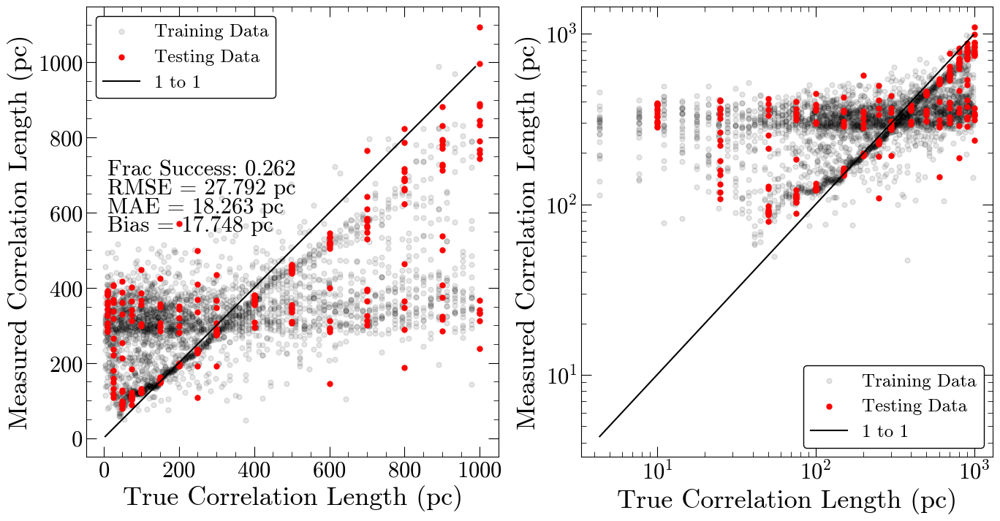

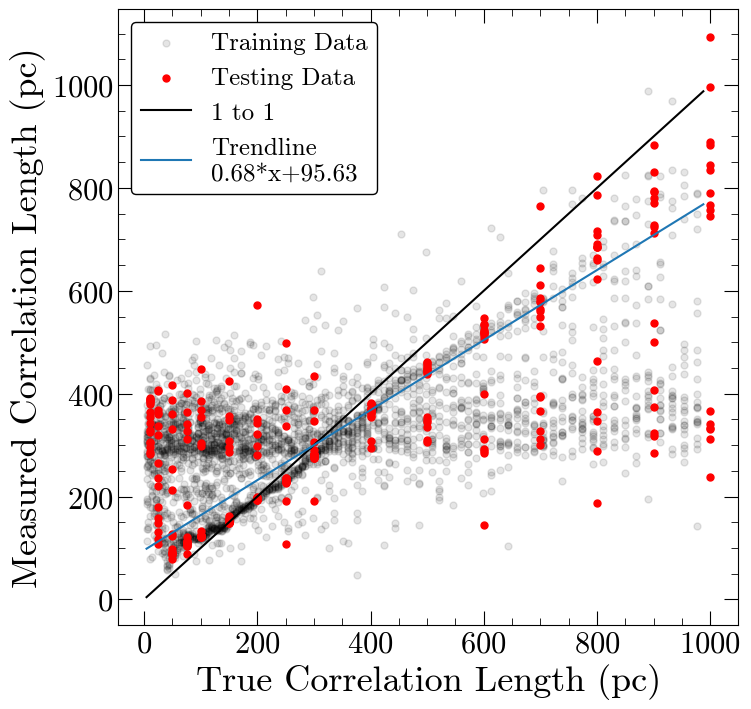

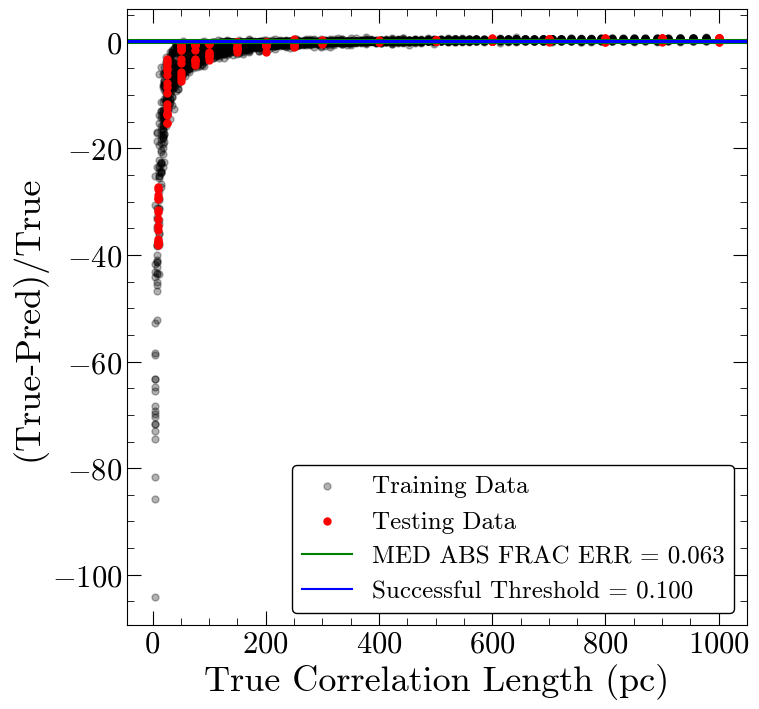

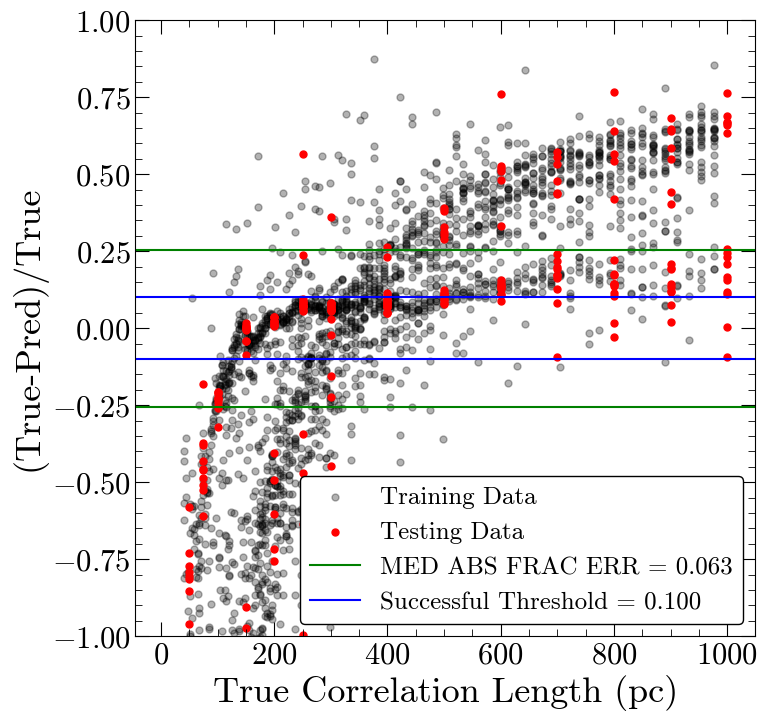

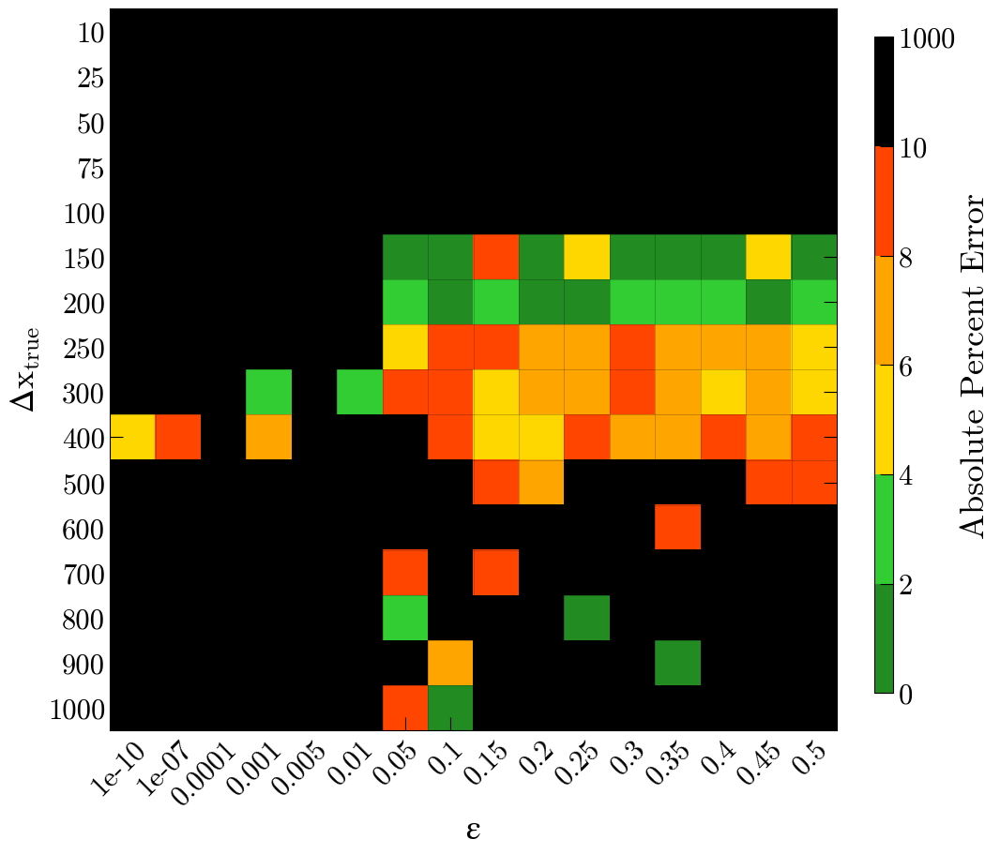

Number of squares with abs percent err>10%,  189


In [37]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 8ms/step - loss: 107218.4453
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 66500.6797
Epoch 3/100
92/92 [==============================] - 1s 9ms/step - loss: 65202.6445
Epoch 4/100
92/92 [==============================] - 1s 7ms/step - loss: 64487.8047
Epoch 5/100
92/92 [==============================] - 1s 8ms/step - loss: 64131.1680
Epoch 6/100
92/92 [==============================] - 1s 7ms/step - loss: 62919.9531
Epoch 7/100
92/92 [==============================] - 1s 7ms/step - loss: 62045.5312
Epoch 8/100
92/92 [==============================] - 1s 6ms/step - loss: 61136.5078
Epoch 9/100
92/92 [==============================] - 1s 6ms/step - loss: 60207.6484
Epoch 10/100
92/92 [==============================] - 1s 7ms/step - loss: 58767.1992
Epoch 11/100
92/92 [==============================] - 1s 7ms/step - loss: 57758.8242
Epoch 12/100
92/92 [==============================] - 1s 9ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 233.835 pc
MAE: 142.069 pc
BIAS: 17.547 pc
MED FRAC ERR: 0.509 

Training Stats, Successful Fits
Frac Success Fit: 0.101 
RMSE: 30.915 pc
MAE: 20.686 pc
BIAS: 15.877 pc
MED FRAC ERR: 0.060 

Testing Stats
RMSE: 220.445 pc
MAE: 66.067 pc
BIAS: 36.185 pc
MED FRAC ERR: 0.262 

Testing Stats, Successful Fits
Frac Success Fit: 0.188 
RMSE: 45.574 pc
MAE: 37.455 pc
BIAS: 36.182 pc
MED FRAC ERR: 0.069 


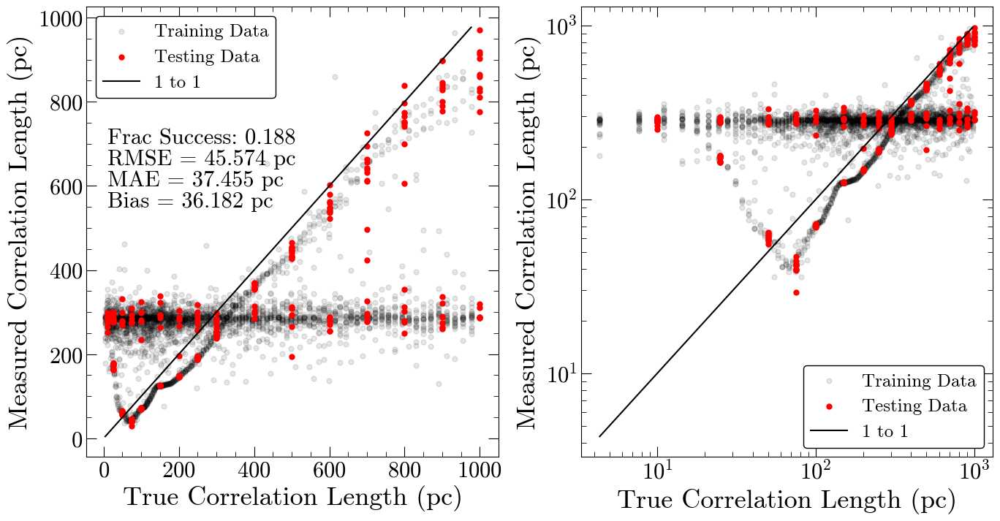

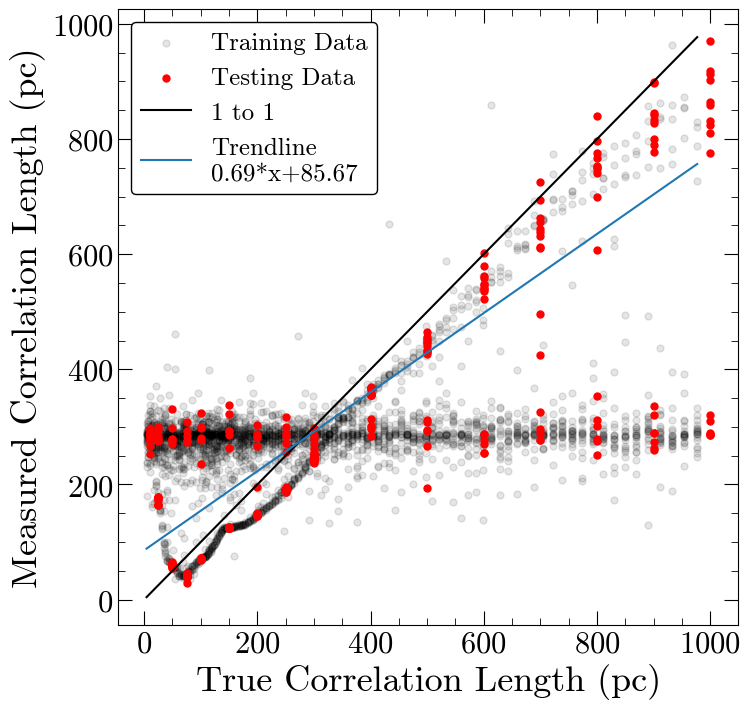

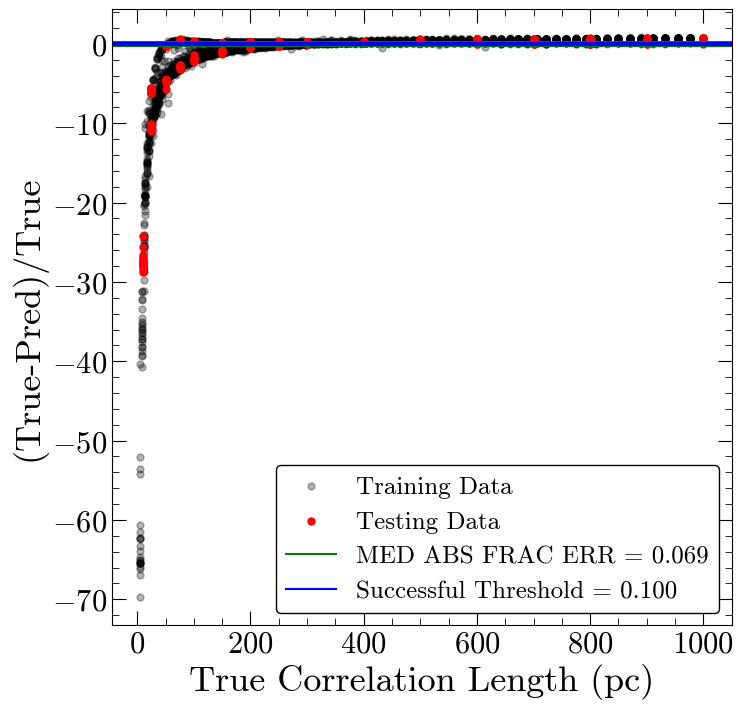

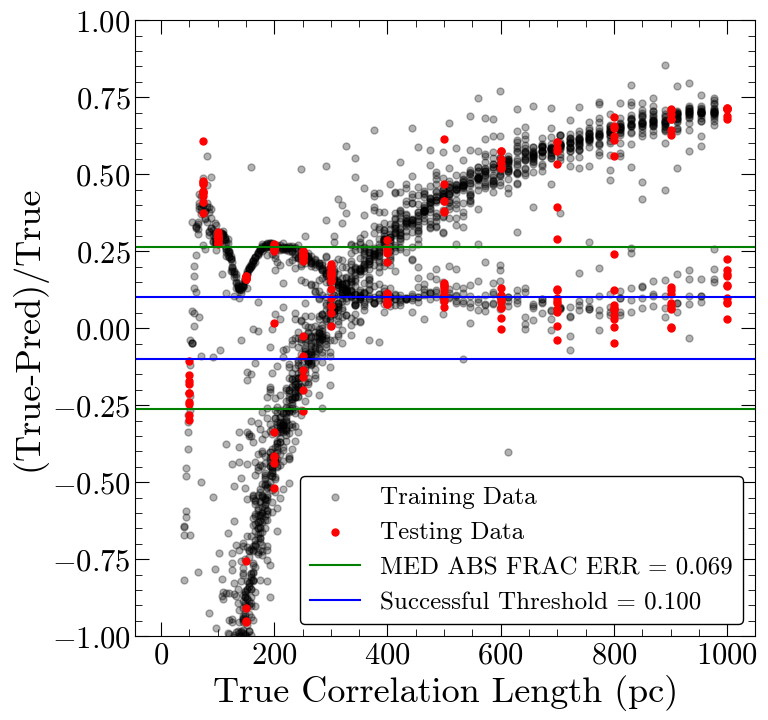

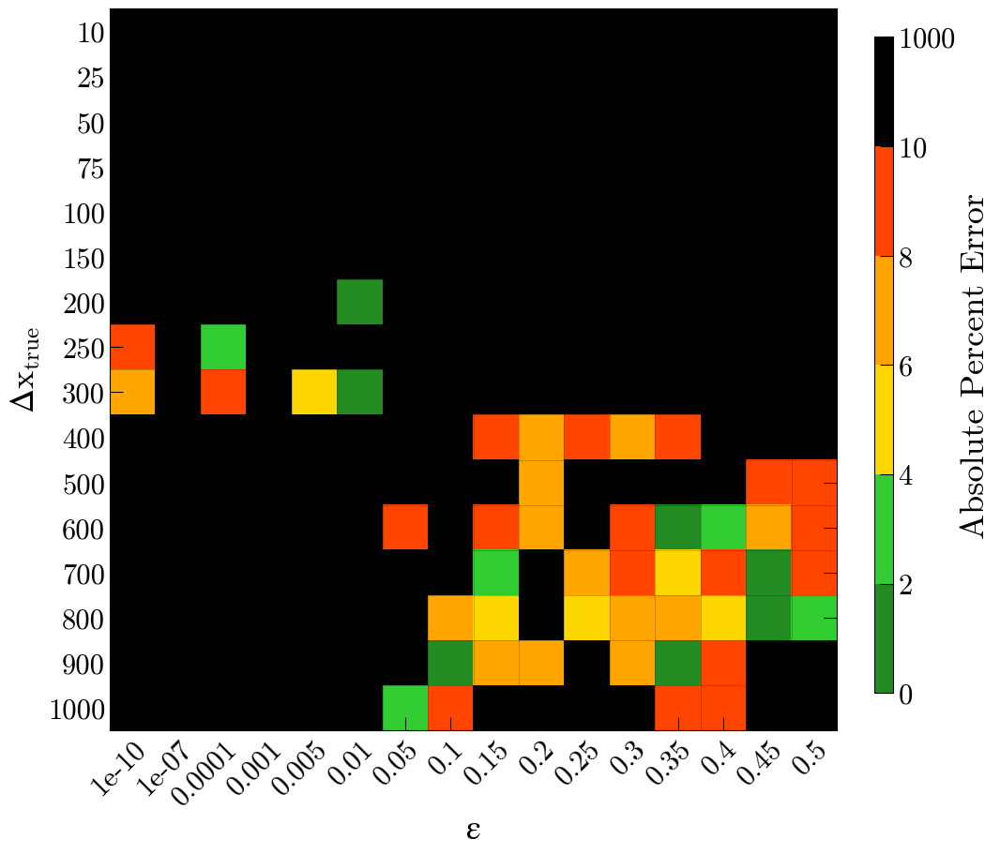

Number of squares with abs percent err>10%,  208


In [38]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 8ms/step - loss: 108973.0781
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 65732.9375
Epoch 3/100
92/92 [==============================] - 1s 6ms/step - loss: 64737.4805
Epoch 4/100
92/92 [==============================] - 1s 7ms/step - loss: 64598.5586
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 63234.2188
Epoch 6/100
92/92 [==============================] - 1s 7ms/step - loss: 62476.5859
Epoch 7/100
92/92 [==============================] - 1s 8ms/step - loss: 61257.2695
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 60084.0898
Epoch 9/100
92/92 [==============================] - 1s 7ms/step - loss: 59287.4766
Epoch 10/100
92/92 [==============================] - 1s 8ms/step - loss: 57410.5430
Epoch 11/100
92/92 [==============================] - 1s 8ms/step - loss: 57690.4961
Epoch 12/100
92/92 [==============================] - 1s 8ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 230.943 pc
MAE: 160.805 pc
BIAS: -28.417 pc
MED FRAC ERR: 0.519 

Training Stats, Successful Fits
Frac Success Fit: 0.189 
RMSE: 19.591 pc
MAE: 12.330 pc
BIAS: 4.724 pc
MED FRAC ERR: 0.042 

Testing Stats
RMSE: 215.803 pc
MAE: 47.782 pc
BIAS: -6.793 pc
MED FRAC ERR: 0.130 

Testing Stats, Successful Fits
Frac Success Fit: 0.379 
RMSE: 28.537 pc
MAE: 14.272 pc
BIAS: 0.127 pc
MED FRAC ERR: 0.042 


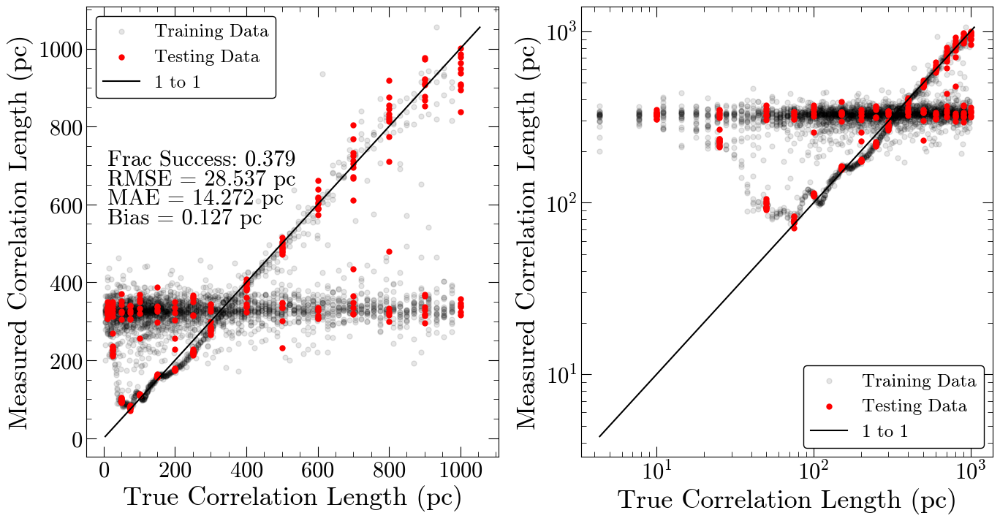

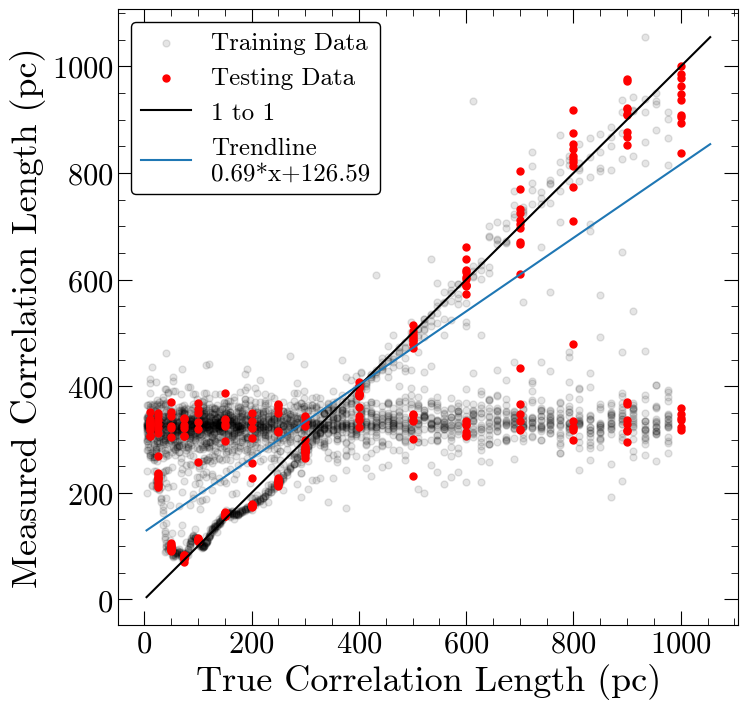

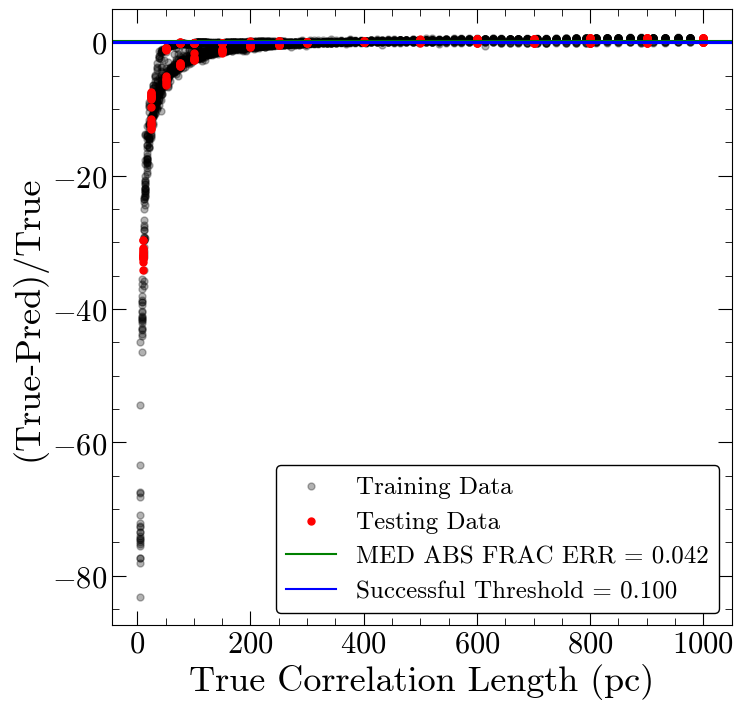

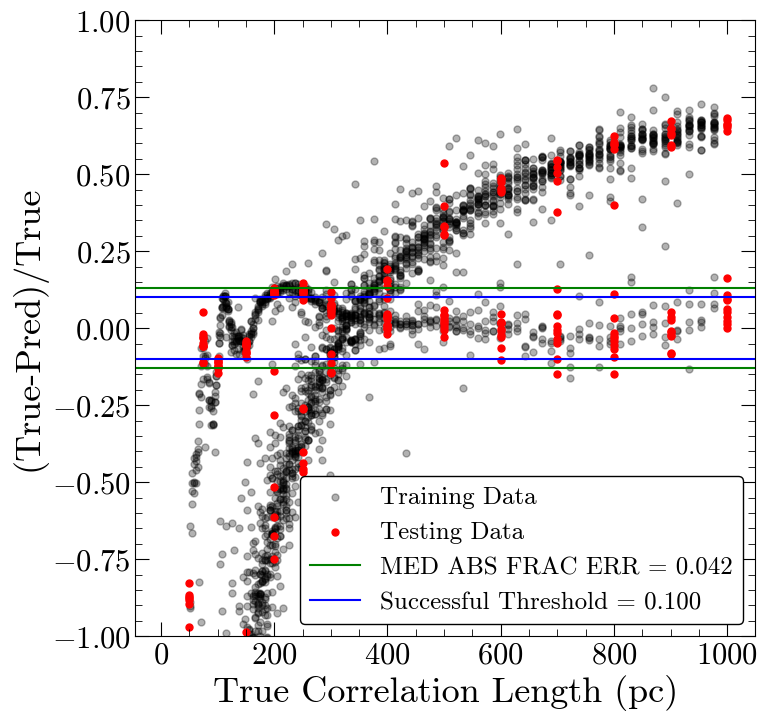

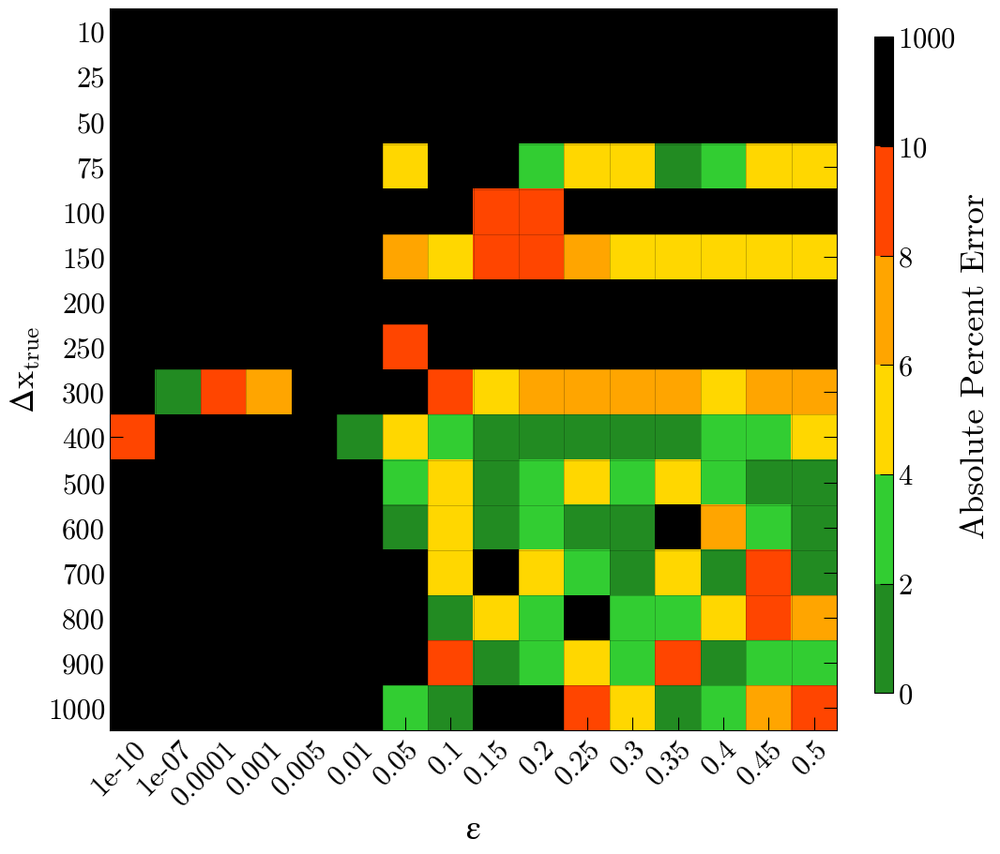

Number of squares with abs percent err>10%,  159


In [39]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 1s 8ms/step - loss: 106407.4844
Epoch 2/200
92/92 [==============================] - 1s 9ms/step - loss: 66175.9219
Epoch 3/200
92/92 [==============================] - 1s 8ms/step - loss: 65556.2656
Epoch 4/200
92/92 [==============================] - 1s 7ms/step - loss: 64558.7461
Epoch 5/200
92/92 [==============================] - 1s 9ms/step - loss: 64029.0898
Epoch 6/200
92/92 [==============================] - 1s 9ms/step - loss: 63051.8203
Epoch 7/200
92/92 [==============================] - 1s 8ms/step - loss: 62677.0938
Epoch 8/200
92/92 [==============================] - 1s 9ms/step - loss: 61793.0508
Epoch 9/200
92/92 [==============================] - 1s 9ms/step - loss: 60128.7773
Epoch 10/200
92/92 [==============================] - 1s 8ms/step - loss: 59057.6719
Epoch 11/200
92/92 [==============================] - 1s 9ms/step - loss: 57644.9805
Epoch 12/200
92/92 [==============================] - 1s 8ms/step - loss:

92/92 [==============================] - 1s 10ms/step - loss: 44284.9844
Epoch 193/200
92/92 [==============================] - 1s 10ms/step - loss: 44245.6680
Epoch 194/200
92/92 [==============================] - 1s 9ms/step - loss: 44642.4336
Epoch 195/200
92/92 [==============================] - 1s 9ms/step - loss: 44263.8594
Epoch 196/200
92/92 [==============================] - 1s 9ms/step - loss: 44040.6133
Epoch 197/200
92/92 [==============================] - 1s 9ms/step - loss: 43991.9648
Epoch 198/200
92/92 [==============================] - 1s 10ms/step - loss: 43568.7461
Epoch 199/200
92/92 [==============================] - 1s 8ms/step - loss: 43054.7852
Epoch 200/200
92/92 [==============================] - 1s 9ms/step - loss: 43454.6758

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 206.840 pc
MAE: 118.237 pc
BIAS: 1.944 pc
MED FRAC ERR: 0.416 

Training Stats, Successful Fits
Frac Success Fit: 0.163 
RMSE: 28.410 pc
MAE: 19.001 pc
BIAS: 13.906 pc
MED FRAC ERR: 0.059 

Testing Stats
RMSE: 229.059 pc
MAE: 60.833 pc
BIAS: 18.912 pc
MED FRAC ERR: 0.223 

Testing Stats, Successful Fits
Frac Success Fit: 0.309 
RMSE: 34.481 pc
MAE: 19.823 pc
BIAS: 15.275 pc
MED FRAC ERR: 0.064 


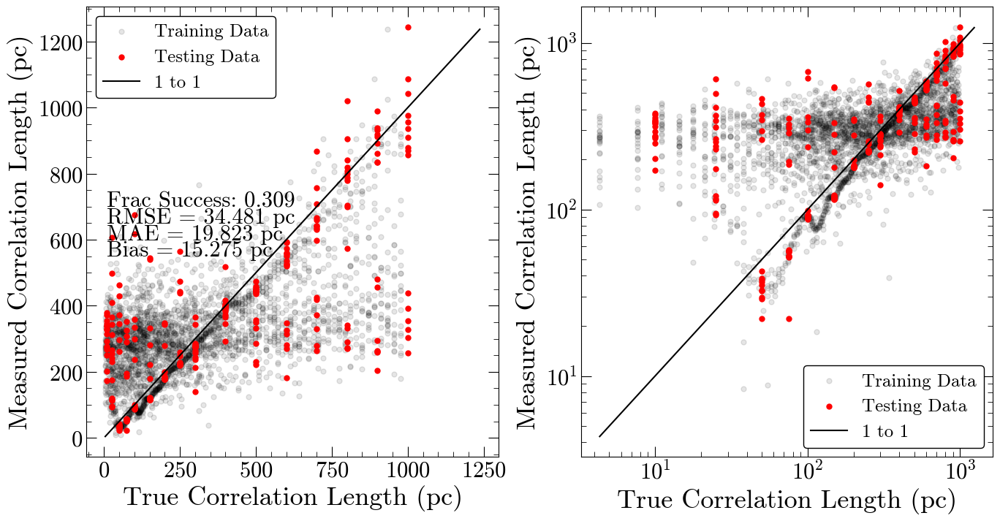

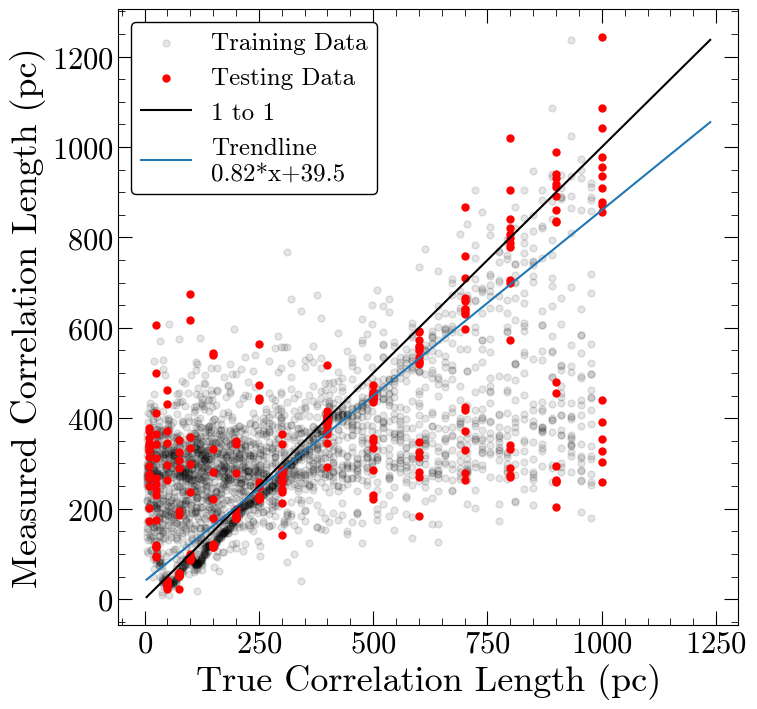

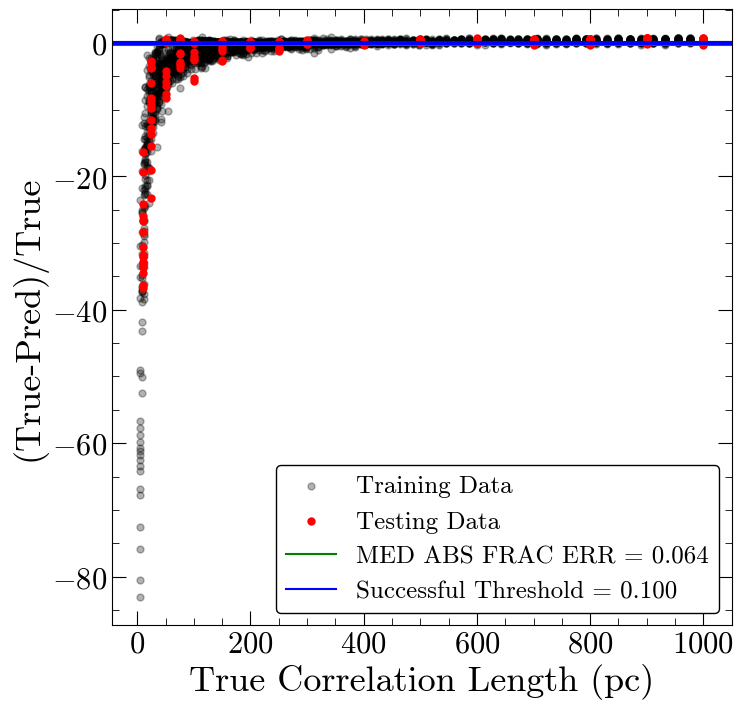

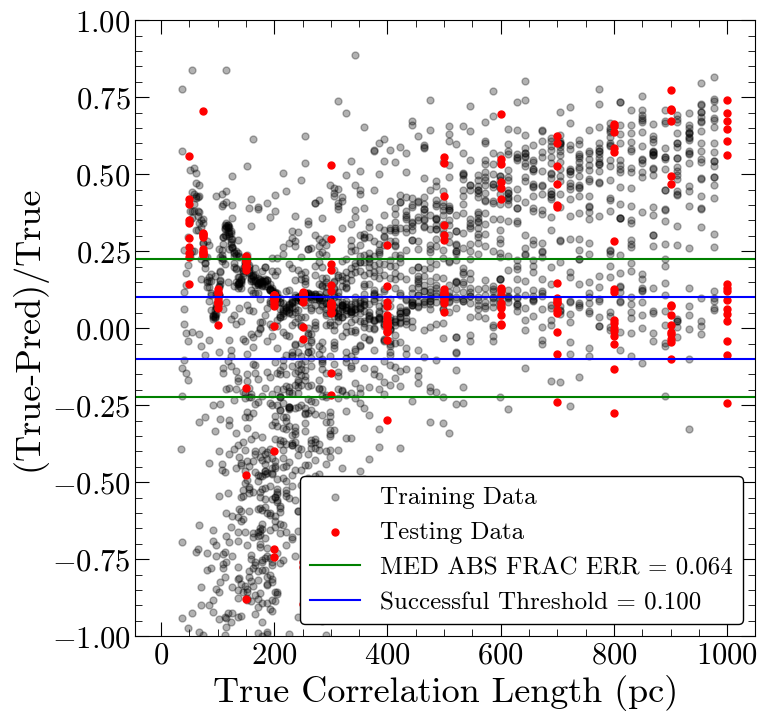

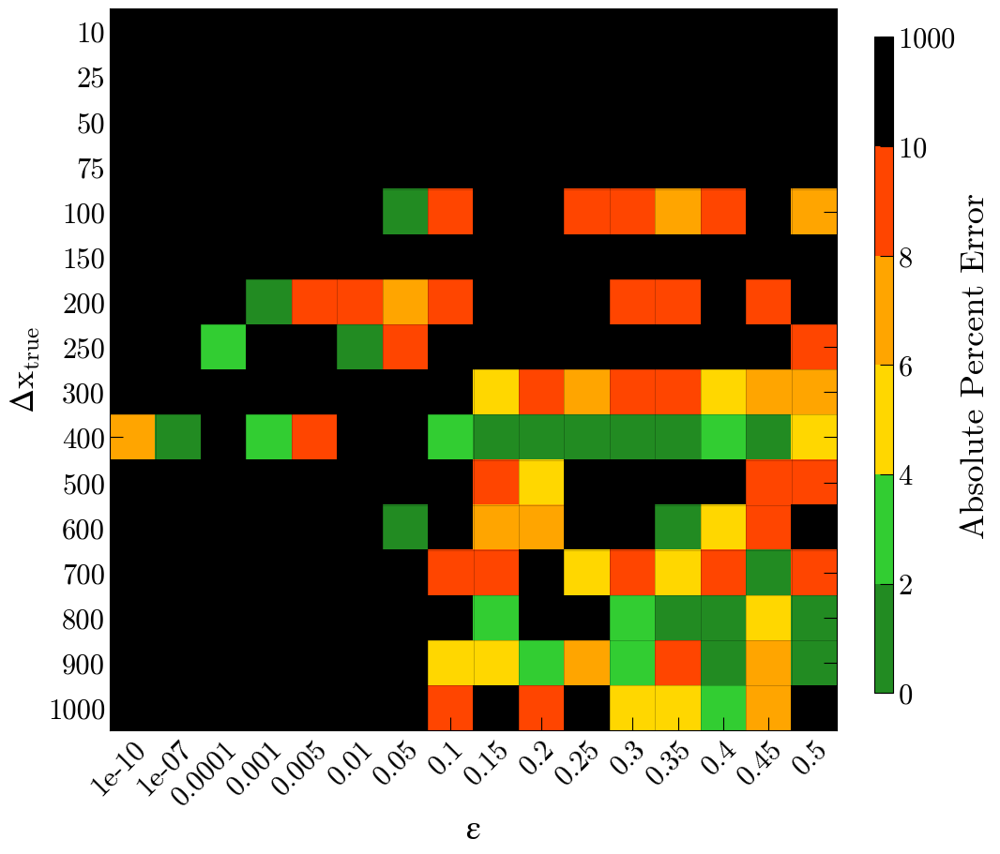

Number of squares with abs percent err>10%,  177


In [40]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 1s 10ms/step - loss: 102423.6172
Epoch 2/400
92/92 [==============================] - 1s 8ms/step - loss: 64822.1836
Epoch 3/400
92/92 [==============================] - 1s 8ms/step - loss: 63244.2266
Epoch 4/400
92/92 [==============================] - 1s 8ms/step - loss: 60448.2227
Epoch 5/400
92/92 [==============================] - 1s 8ms/step - loss: 58744.9609
Epoch 6/400
92/92 [==============================] - 1s 8ms/step - loss: 58709.6484
Epoch 7/400
92/92 [==============================] - 1s 8ms/step - loss: 57508.6602
Epoch 8/400
92/92 [==============================] - 1s 10ms/step - loss: 57322.3672
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 57408.6562
Epoch 10/400
92/92 [==============================] - 1s 8ms/step - loss: 57241.0547
Epoch 11/400
92/92 [==============================] - 1s 9ms/step - loss: 57470.1719
Epoch 12/400
92/92 [==============================] - 1s 9ms/step - lo

92/92 [==============================] - 1s 9ms/step - loss: 54767.9688
Epoch 98/400
92/92 [==============================] - 1s 9ms/step - loss: 54898.9297
Epoch 99/400
92/92 [==============================] - 1s 8ms/step - loss: 54766.5430
Epoch 100/400
92/92 [==============================] - 1s 9ms/step - loss: 54619.7422
Epoch 101/400
92/92 [==============================] - 1s 9ms/step - loss: 54486.4414
Epoch 102/400
92/92 [==============================] - 1s 9ms/step - loss: 54402.3125
Epoch 103/400
92/92 [==============================] - 1s 8ms/step - loss: 54494.7305
Epoch 104/400
92/92 [==============================] - 1s 8ms/step - loss: 54723.2109
Epoch 105/400
92/92 [==============================] - 1s 8ms/step - loss: 54432.2539
Epoch 106/400
92/92 [==============================] - 1s 8ms/step - loss: 54340.7383
Epoch 107/400
92/92 [==============================] - 1s 9ms/step - loss: 54380.0000
Epoch 108/400
92/92 [==============================] - 1s 9ms/step - l

92/92 [==============================] - 1s 10ms/step - loss: 40731.8789
Epoch 287/400
92/92 [==============================] - 1s 10ms/step - loss: 40095.9219
Epoch 288/400
92/92 [==============================] - 1s 9ms/step - loss: 40124.6562
Epoch 289/400
92/92 [==============================] - 1s 10ms/step - loss: 40146.4375
Epoch 290/400
92/92 [==============================] - 1s 9ms/step - loss: 40017.3242
Epoch 291/400
92/92 [==============================] - 1s 9ms/step - loss: 40656.1953
Epoch 292/400
92/92 [==============================] - 1s 11ms/step - loss: 39499.5156
Epoch 293/400
92/92 [==============================] - 1s 7ms/step - loss: 39610.4141
Epoch 294/400
92/92 [==============================] - 1s 9ms/step - loss: 39385.7227
Epoch 295/400
92/92 [==============================] - 1s 8ms/step - loss: 39503.6836
Epoch 296/400
92/92 [==============================] - 1s 7ms/step - loss: 40084.9492
Epoch 297/400
92/92 [==============================] - 1s 8ms/st

92/92 [==============================] - 1s 9ms/step - loss: 32246.4746
Epoch 382/400
92/92 [==============================] - 1s 9ms/step - loss: 32039.4629
Epoch 383/400
92/92 [==============================] - 1s 9ms/step - loss: 31936.7754
Epoch 384/400
92/92 [==============================] - 1s 8ms/step - loss: 32502.3945
Epoch 385/400
92/92 [==============================] - 1s 8ms/step - loss: 30578.1719
Epoch 386/400
92/92 [==============================] - 1s 8ms/step - loss: 31900.9102
Epoch 387/400
92/92 [==============================] - 1s 8ms/step - loss: 30847.9043
Epoch 388/400
92/92 [==============================] - 1s 9ms/step - loss: 31094.5215
Epoch 389/400
92/92 [==============================] - 1s 10ms/step - loss: 30624.9316
Epoch 390/400
92/92 [==============================] - 1s 10ms/step - loss: 30924.3027
Epoch 391/400
92/92 [==============================] - 1s 9ms/step - loss: 30610.5176
Epoch 392/400
92/92 [==============================] - 1s 9ms/step

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 185.505 pc
MAE: 95.175 pc
BIAS: -30.344 pc
MED FRAC ERR: 0.334 

Training Stats, Successful Fits
Frac Success Fit: 0.268 
RMSE: 23.956 pc
MAE: 10.188 pc
BIAS: 2.926 pc
MED FRAC ERR: 0.037 

Testing Stats
RMSE: 254.173 pc
MAE: 37.298 pc
BIAS: 1.082 pc
MED FRAC ERR: 0.156 

Testing Stats, Successful Fits
Frac Success Fit: 0.465 
RMSE: 25.935 pc
MAE: 9.735 pc
BIAS: 1.871 pc
MED FRAC ERR: 0.029 


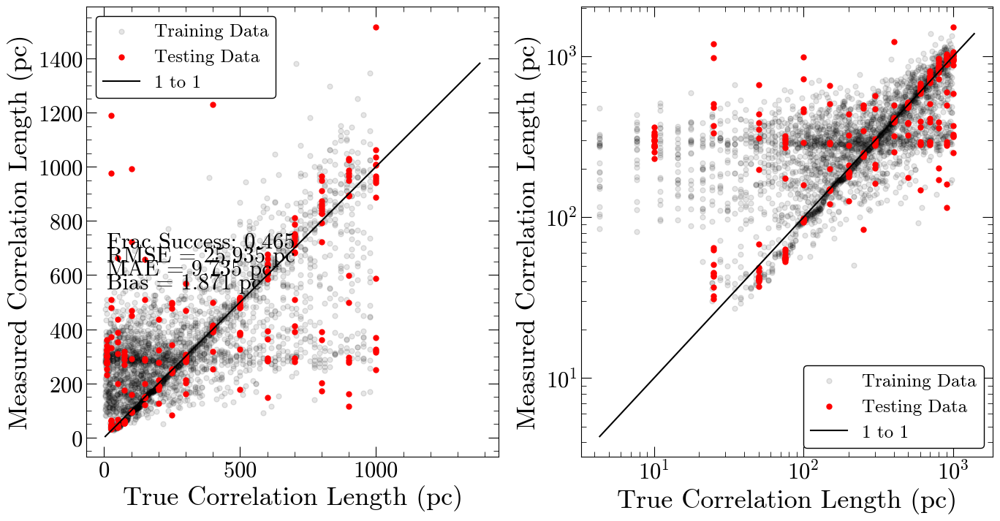

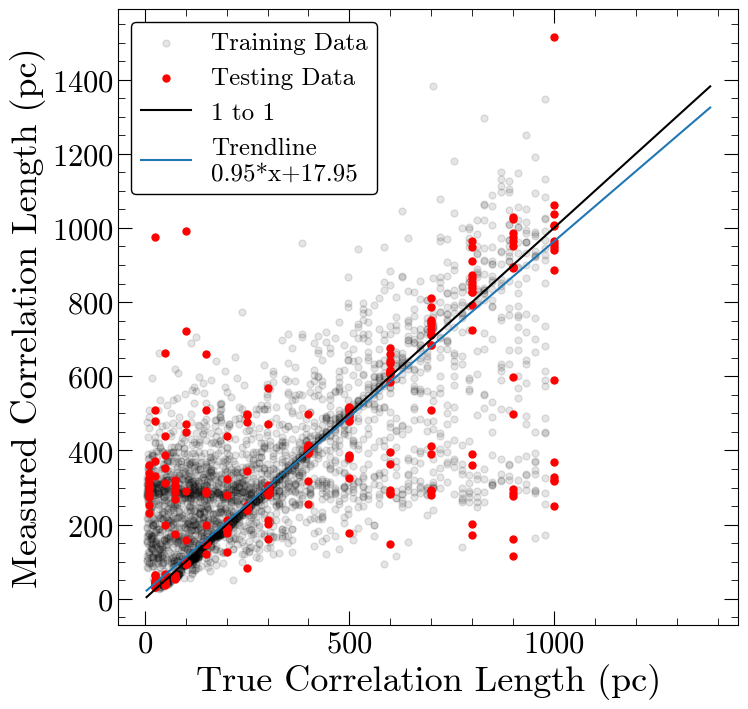

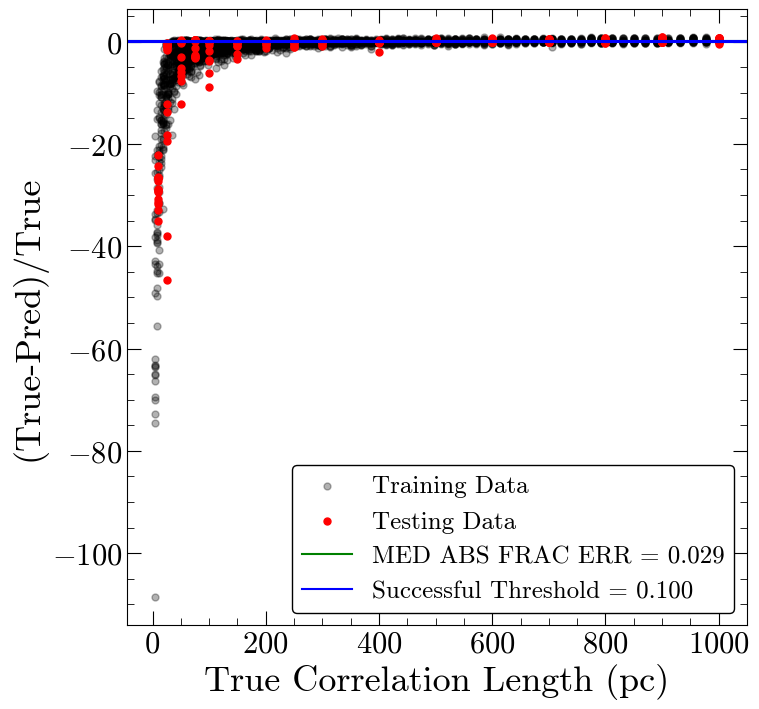

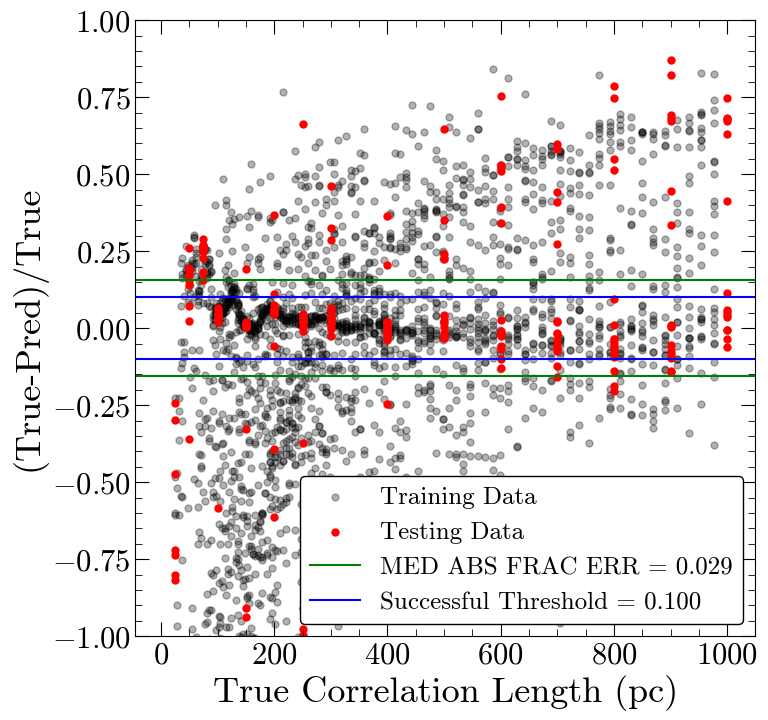

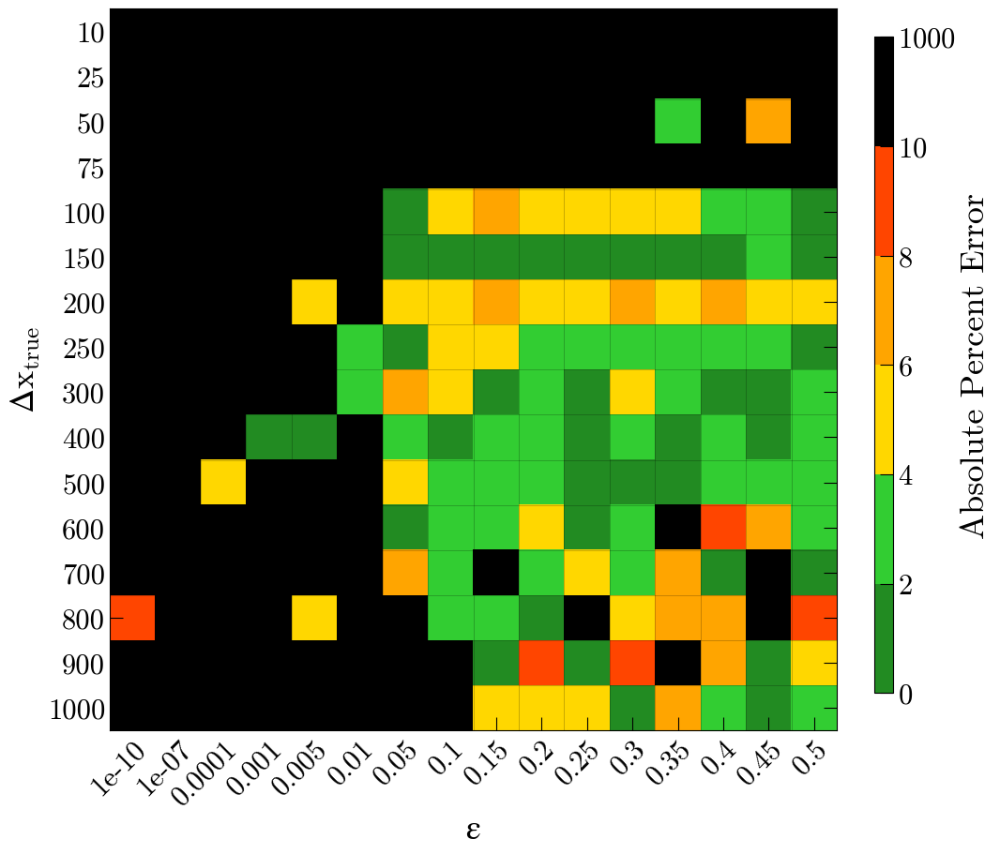

Number of squares with abs percent err>10%,  137


In [41]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 10ms/step - loss: 99507.1797
Epoch 2/400
92/92 [==============================] - 1s 10ms/step - loss: 65419.3438
Epoch 3/400
92/92 [==============================] - 1s 9ms/step - loss: 61914.2539
Epoch 4/400
92/92 [==============================] - 1s 10ms/step - loss: 59821.2656
Epoch 5/400
92/92 [==============================] - 1s 10ms/step - loss: 59103.6719
Epoch 6/400
92/92 [==============================] - 1s 11ms/step - loss: 57349.3477
Epoch 7/400
92/92 [==============================] - 1s 11ms/step - loss: 57161.0273
Epoch 8/400
92/92 [==============================] - 1s 11ms/step - loss: 57144.2422
Epoch 9/400
92/92 [==============================] - 1s 11ms/step - loss: 56745.9023
Epoch 10/400
92/92 [==============================] - 1s 10ms/step - loss: 56833.0625
Epoch 11/400
92/92 [==============================] - 1s 9ms/step - loss: 57323.6406
Epoch 12/400
92/92 [==============================] - 1s 10ms/ste

92/92 [==============================] - 1s 10ms/step - loss: 29658.6543
Epoch 191/400
92/92 [==============================] - 1s 9ms/step - loss: 29111.4844
Epoch 192/400
92/92 [==============================] - 1s 10ms/step - loss: 28149.6797
Epoch 193/400
92/92 [==============================] - 1s 9ms/step - loss: 28519.3418
Epoch 194/400
92/92 [==============================] - 1s 8ms/step - loss: 28146.2520
Epoch 195/400
92/92 [==============================] - 1s 8ms/step - loss: 27719.5977
Epoch 196/400
92/92 [==============================] - 1s 9ms/step - loss: 26168.7402
Epoch 197/400
92/92 [==============================] - 1s 7ms/step - loss: 26952.7988
Epoch 198/400
92/92 [==============================] - 1s 9ms/step - loss: 26409.2812
Epoch 199/400
92/92 [==============================] - 1s 9ms/step - loss: 29138.9980
Epoch 200/400
92/92 [==============================] - 1s 10ms/step - loss: 26014.1875
Epoch 201/400
92/92 [==============================] - 1s 11ms/st

92/92 [==============================] - 1s 10ms/step - loss: 6946.9717
Epoch 380/400
92/92 [==============================] - 1s 11ms/step - loss: 6863.8311
Epoch 381/400
92/92 [==============================] - 1s 9ms/step - loss: 6575.8906
Epoch 382/400
92/92 [==============================] - 1s 10ms/step - loss: 7891.3975
Epoch 383/400
92/92 [==============================] - 1s 12ms/step - loss: 7049.8623
Epoch 384/400
92/92 [==============================] - 1s 10ms/step - loss: 6505.3979
Epoch 385/400
92/92 [==============================] - 1s 11ms/step - loss: 6624.1367
Epoch 386/400
92/92 [==============================] - 1s 13ms/step - loss: 6030.6318
Epoch 387/400
92/92 [==============================] - 1s 11ms/step - loss: 6361.8843
Epoch 388/400
92/92 [==============================] - 1s 11ms/step - loss: 6209.0098
Epoch 389/400
92/92 [==============================] - 1s 10ms/step - loss: 6623.3872
Epoch 390/400
92/92 [==============================] - 1s 10ms/step -

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 76.034 pc
MAE: 23.834 pc
BIAS: -1.307 pc
MED FRAC ERR: 0.105 

Training Stats, Successful Fits
Frac Success Fit: 0.488 
RMSE: 23.149 pc
MAE: 10.712 pc
BIAS: -2.789 pc
MED FRAC ERR: 0.038 

Testing Stats
RMSE: 259.307 pc
MAE: 29.070 pc
BIAS: -4.016 pc
MED FRAC ERR: 0.078 

Testing Stats, Successful Fits
Frac Success Fit: 0.527 
RMSE: 22.736 pc
MAE: 9.528 pc
BIAS: -4.499 pc
MED FRAC ERR: 0.035 


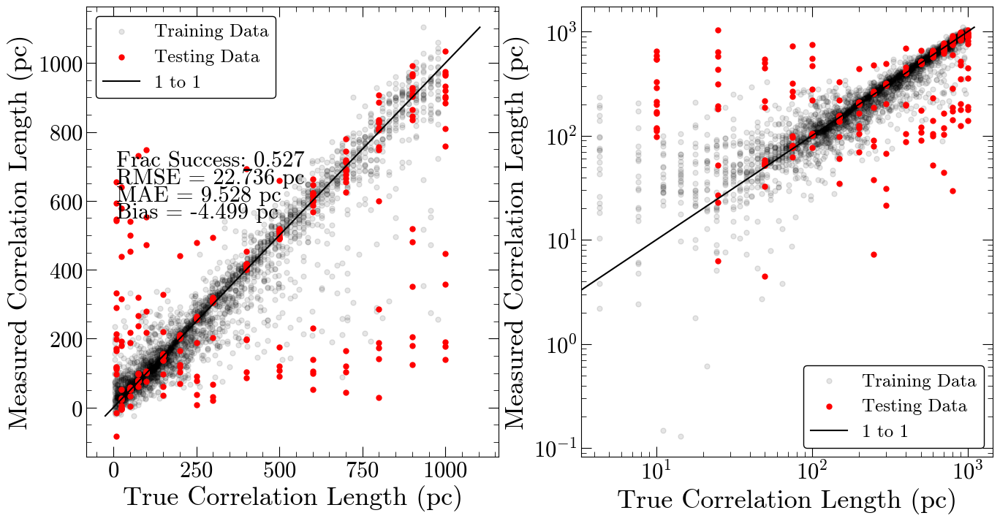

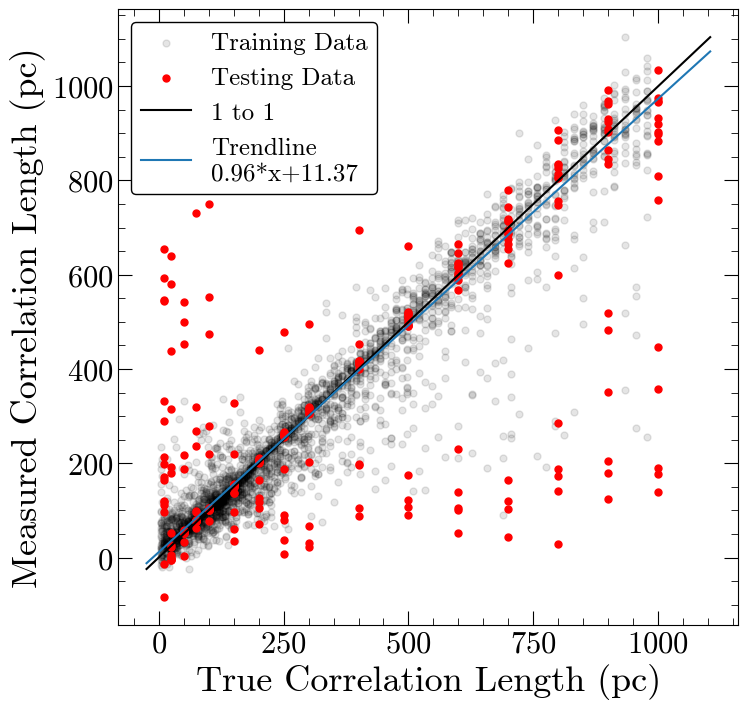

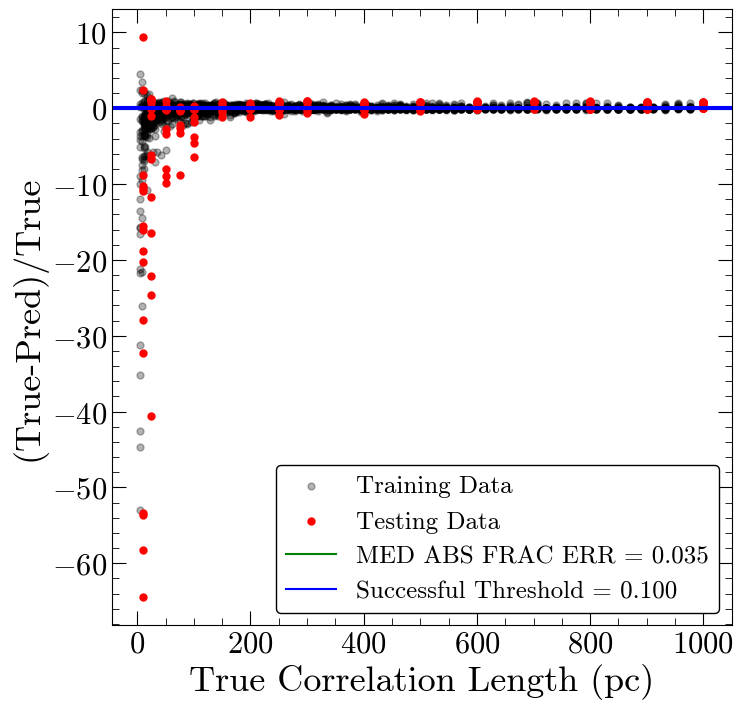

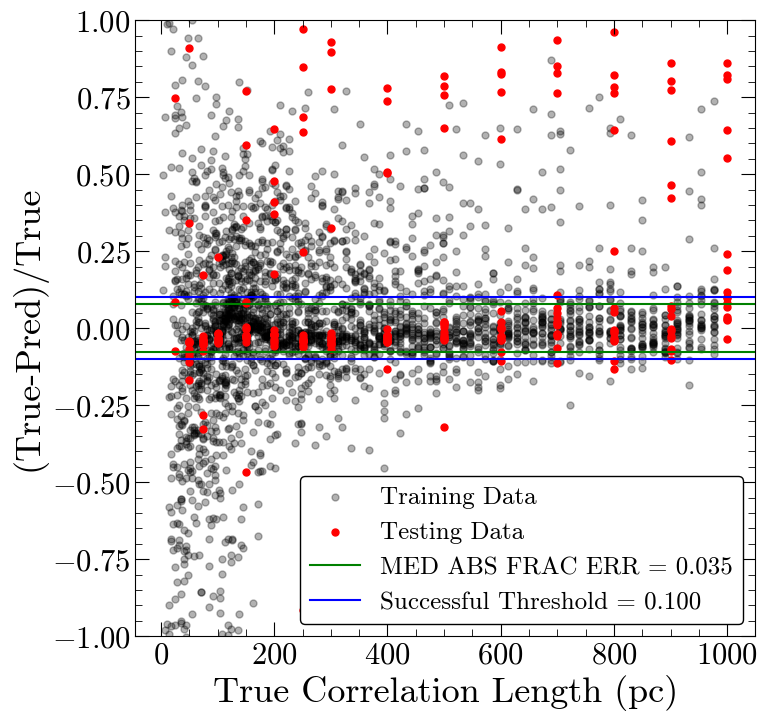

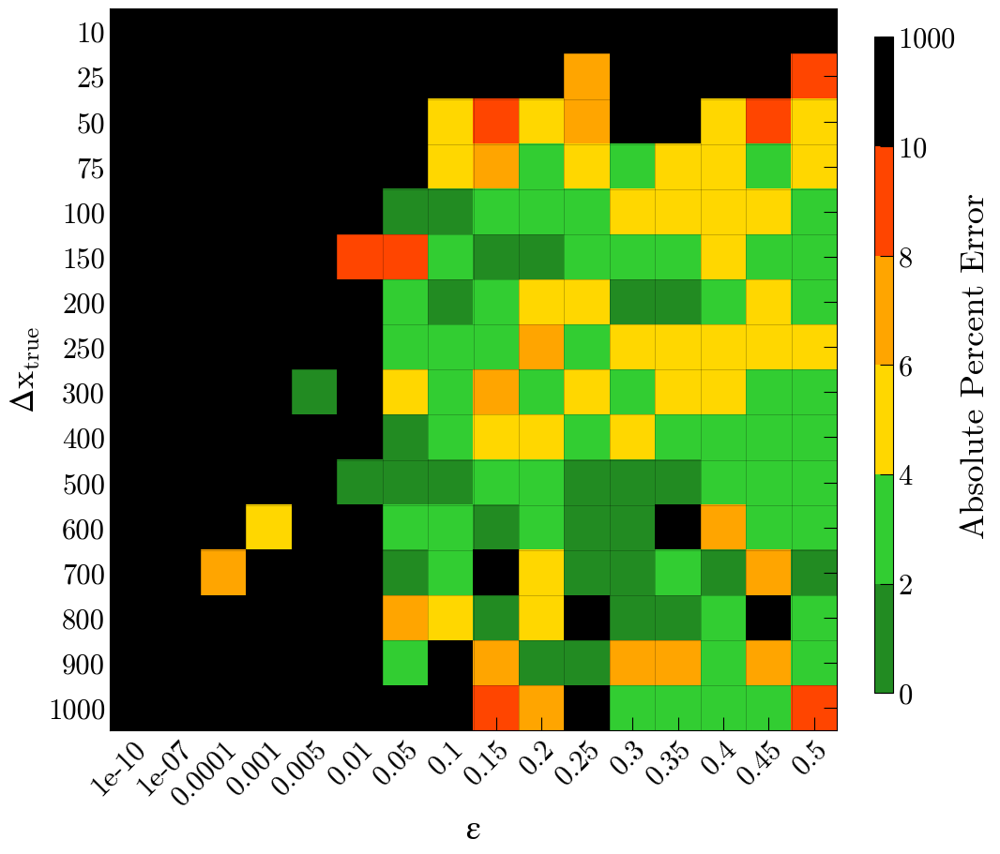

Number of squares with abs percent err>10%,  121


In [42]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 1s 13ms/step - loss: 125103.3047
Epoch 2/400
46/46 [==============================] - 0s 10ms/step - loss: 68721.4922
Epoch 3/400
46/46 [==============================] - 0s 10ms/step - loss: 64848.1523
Epoch 4/400
46/46 [==============================] - 1s 11ms/step - loss: 63770.6172
Epoch 5/400
46/46 [==============================] - 1s 11ms/step - loss: 62407.1328
Epoch 6/400
46/46 [==============================] - 1s 11ms/step - loss: 59898.0859
Epoch 7/400
46/46 [==============================] - 1s 12ms/step - loss: 58435.6445
Epoch 8/400
46/46 [==============================] - 1s 11ms/step - loss: 58212.7109
Epoch 9/400
46/46 [==============================] - 1s 11ms/step - loss: 57229.7500
Epoch 10/400
46/46 [==============================] - 0s 10ms/step - loss: 57609.9531
Epoch 11/400
46/46 [==============================] - 1s 12ms/step - loss: 57161.1914
Epoch 12/400
46/46 [==============================] - 0s 11ms/

46/46 [==============================] - 1s 14ms/step - loss: 43357.8555
Epoch 191/400
46/46 [==============================] - 1s 13ms/step - loss: 44038.8516
Epoch 192/400
46/46 [==============================] - 1s 13ms/step - loss: 44126.9492
Epoch 193/400
46/46 [==============================] - 1s 15ms/step - loss: 43314.8711
Epoch 194/400
46/46 [==============================] - 1s 16ms/step - loss: 42843.9570
Epoch 195/400
46/46 [==============================] - 1s 15ms/step - loss: 43057.2422
Epoch 196/400
46/46 [==============================] - 1s 15ms/step - loss: 43387.5898
Epoch 197/400
46/46 [==============================] - 1s 13ms/step - loss: 42795.6133
Epoch 198/400
46/46 [==============================] - 1s 13ms/step - loss: 42790.4102
Epoch 199/400
46/46 [==============================] - 1s 15ms/step - loss: 43272.7773
Epoch 200/400
46/46 [==============================] - 1s 15ms/step - loss: 41996.6875
Epoch 201/400
46/46 [==============================] - 1s

46/46 [==============================] - 1s 16ms/step - loss: 18558.8145
Epoch 379/400
46/46 [==============================] - 1s 15ms/step - loss: 16786.5332
Epoch 380/400
46/46 [==============================] - 1s 13ms/step - loss: 15928.6094
Epoch 381/400
46/46 [==============================] - 1s 16ms/step - loss: 15694.1045
Epoch 382/400
46/46 [==============================] - 1s 15ms/step - loss: 16781.9883
Epoch 383/400
46/46 [==============================] - 1s 17ms/step - loss: 16140.5605
Epoch 384/400
46/46 [==============================] - 1s 14ms/step - loss: 16106.4316
Epoch 385/400
46/46 [==============================] - 1s 13ms/step - loss: 15624.5322
Epoch 386/400
46/46 [==============================] - 1s 13ms/step - loss: 15266.0039
Epoch 387/400
46/46 [==============================] - 1s 17ms/step - loss: 16833.6602
Epoch 388/400
46/46 [==============================] - 1s 14ms/step - loss: 15099.8936
Epoch 389/400
46/46 [==============================] - 1s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 116.754 pc
MAE: 47.503 pc
BIAS: -4.309 pc
MED FRAC ERR: 0.167 

Training Stats, Successful Fits
Frac Success Fit: 0.376 
RMSE: 27.871 pc
MAE: 12.390 pc
BIAS: -1.583 pc
MED FRAC ERR: 0.043 

Testing Stats
RMSE: 248.232 pc
MAE: 38.657 pc
BIAS: -8.618 pc
MED FRAC ERR: 0.138 

Testing Stats, Successful Fits
Frac Success Fit: 0.438 
RMSE: 26.284 pc
MAE: 7.729 pc
BIAS: -7.037 pc
MED FRAC ERR: 0.033 


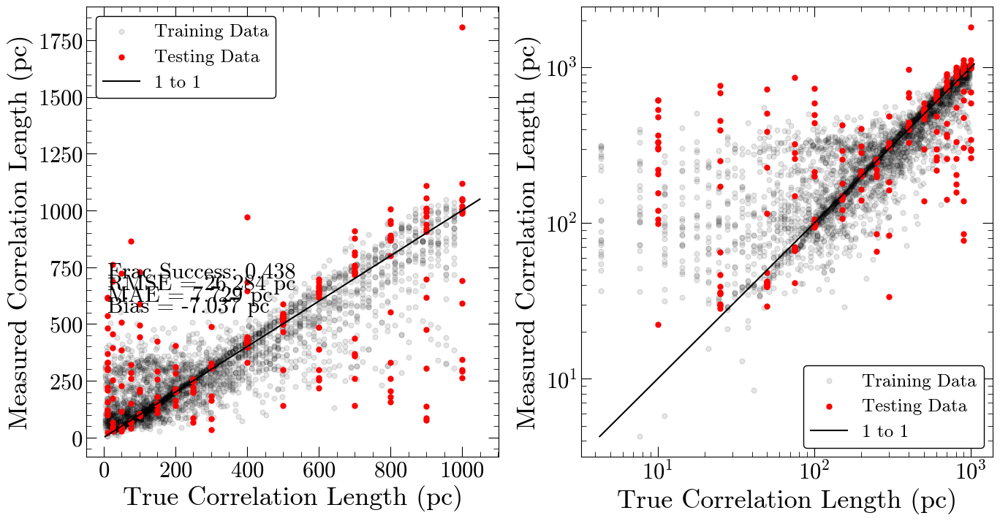

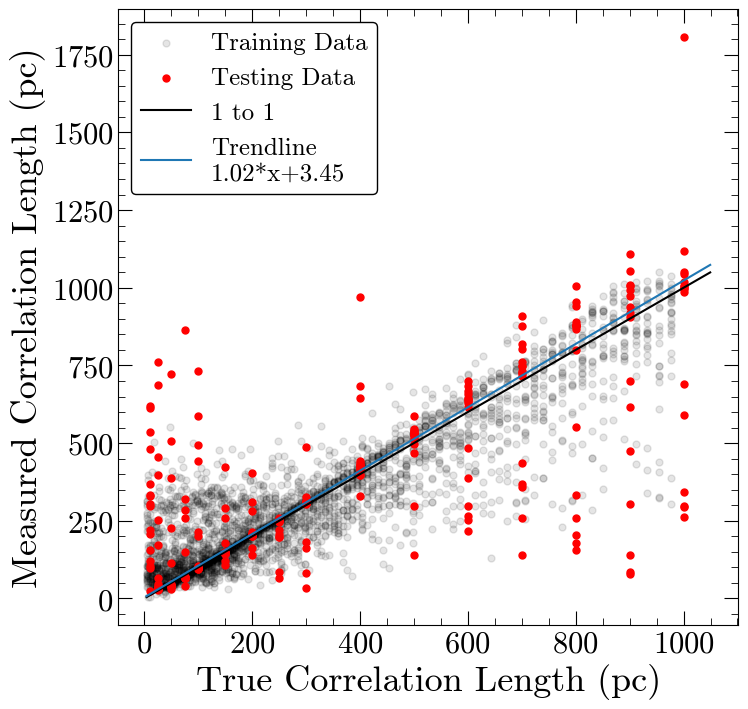

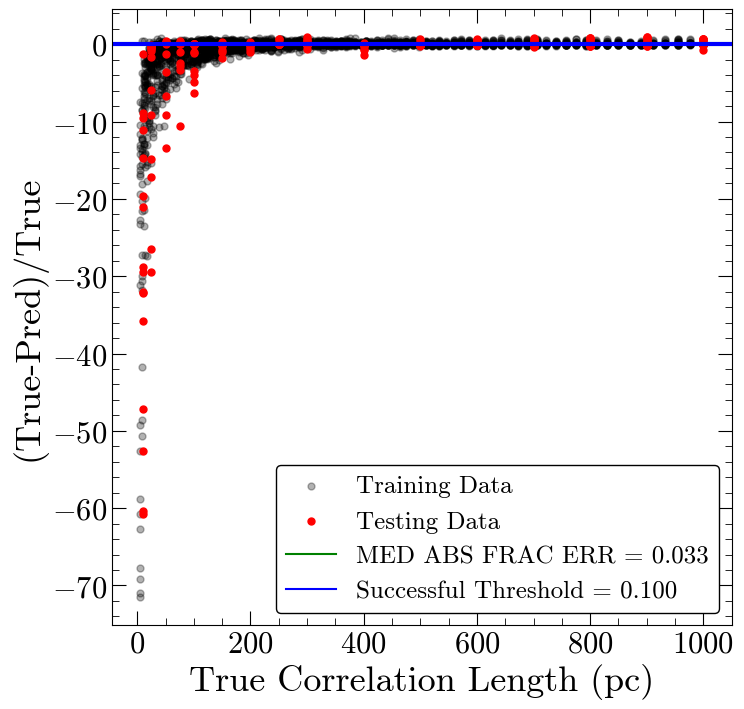

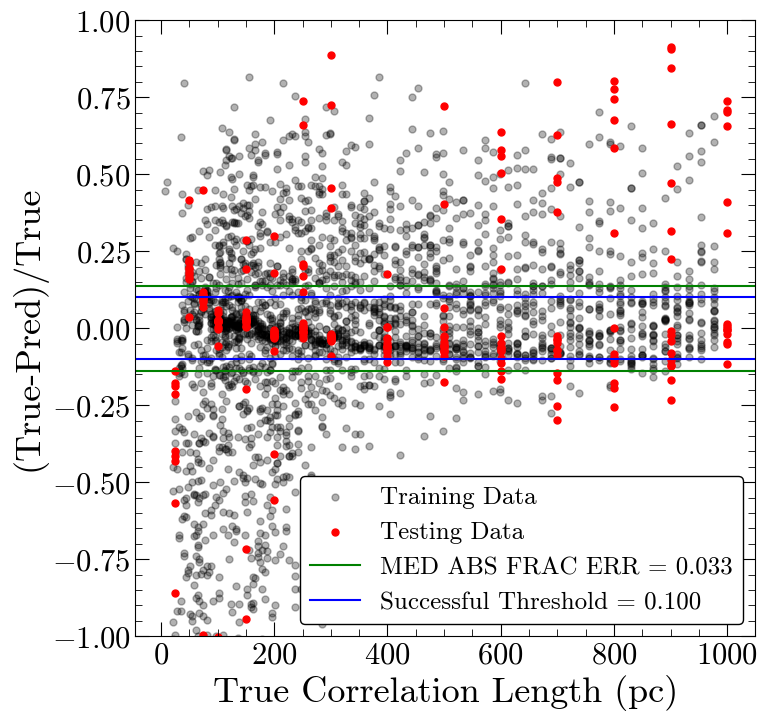

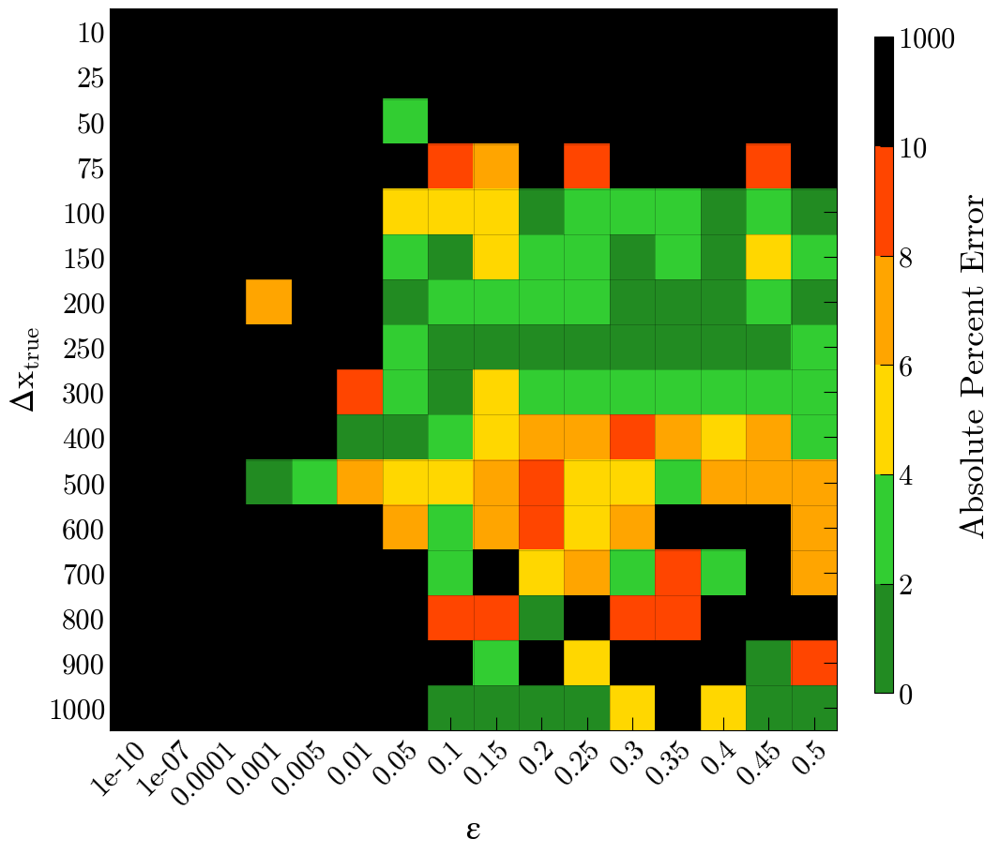

Number of squares with abs percent err>10%,  144


In [43]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 1s 42ms/step - loss: 164186.2031
Epoch 2/400
10/10 [==============================] - 0s 36ms/step - loss: 160031.7500
Epoch 3/400
10/10 [==============================] - 0s 28ms/step - loss: 125406.6875
Epoch 4/400
10/10 [==============================] - 0s 20ms/step - loss: 81299.1172
Epoch 5/400
10/10 [==============================] - 0s 43ms/step - loss: 72670.4453
Epoch 6/400
10/10 [==============================] - 0s 28ms/step - loss: 67760.5469
Epoch 7/400
10/10 [==============================] - 0s 31ms/step - loss: 66251.8672
Epoch 8/400
10/10 [==============================] - 0s 35ms/step - loss: 65388.9180
Epoch 9/400
10/10 [==============================] - 0s 34ms/step - loss: 65207.7734
Epoch 10/400
10/10 [==============================] - 0s 36ms/step - loss: 64732.5117
Epoch 11/400
10/10 [==============================] - 0s 26ms/step - loss: 64410.5820
Epoch 12/400
10/10 [==============================] - 0s 43m

10/10 [==============================] - 0s 32ms/step - loss: 54002.3789
Epoch 191/400
10/10 [==============================] - 0s 32ms/step - loss: 54012.0938
Epoch 192/400
10/10 [==============================] - 0s 32ms/step - loss: 54216.8906
Epoch 193/400
10/10 [==============================] - 0s 33ms/step - loss: 54271.8477
Epoch 194/400
10/10 [==============================] - 0s 23ms/step - loss: 54161.3594
Epoch 195/400
10/10 [==============================] - 0s 29ms/step - loss: 53909.1875
Epoch 196/400
10/10 [==============================] - 0s 27ms/step - loss: 54229.8789
Epoch 197/400
10/10 [==============================] - 0s 26ms/step - loss: 53889.6328
Epoch 198/400
10/10 [==============================] - 0s 23ms/step - loss: 53917.4102
Epoch 199/400
10/10 [==============================] - 0s 30ms/step - loss: 54115.5703
Epoch 200/400
10/10 [==============================] - 0s 20ms/step - loss: 53930.7070
Epoch 201/400
10/10 [==============================] - 0s

10/10 [==============================] - 0s 40ms/step - loss: 46282.5664
Epoch 379/400
10/10 [==============================] - 0s 40ms/step - loss: 46222.3203
Epoch 380/400
10/10 [==============================] - 0s 36ms/step - loss: 46333.6562
Epoch 381/400
10/10 [==============================] - 0s 47ms/step - loss: 46435.7812
Epoch 382/400
10/10 [==============================] - 0s 29ms/step - loss: 47032.2891
Epoch 383/400
10/10 [==============================] - 0s 25ms/step - loss: 47380.5664
Epoch 384/400
10/10 [==============================] - 1s 64ms/step - loss: 46760.0078
Epoch 385/400
10/10 [==============================] - 0s 36ms/step - loss: 46541.6016
Epoch 386/400
10/10 [==============================] - 0s 40ms/step - loss: 46379.6406
Epoch 387/400
10/10 [==============================] - 1s 56ms/step - loss: 46386.0820
Epoch 388/400
10/10 [==============================] - 0s 27ms/step - loss: 45711.5391
Epoch 389/400
10/10 [==============================] - 1s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 210.834 pc
MAE: 121.563 pc
BIAS: -27.703 pc
MED FRAC ERR: 0.427 

Training Stats, Successful Fits
Frac Success Fit: 0.213 
RMSE: 23.701 pc
MAE: 13.552 pc
BIAS: -6.494 pc
MED FRAC ERR: 0.050 

Testing Stats
RMSE: 217.682 pc
MAE: 43.423 pc
BIAS: -22.174 pc
MED FRAC ERR: 0.168 

Testing Stats, Successful Fits
Frac Success Fit: 0.410 
RMSE: 29.674 pc
MAE: 17.606 pc
BIAS: -12.252 pc
MED FRAC ERR: 0.049 


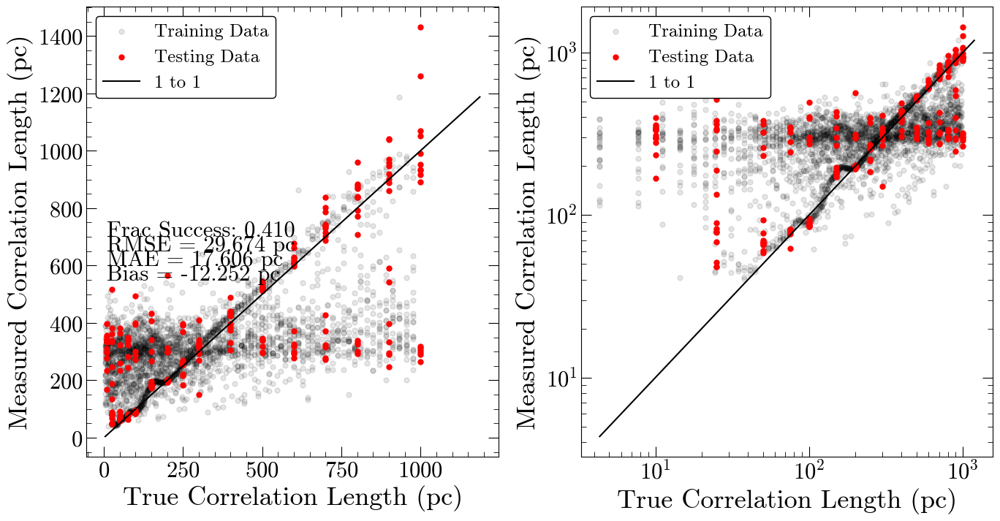

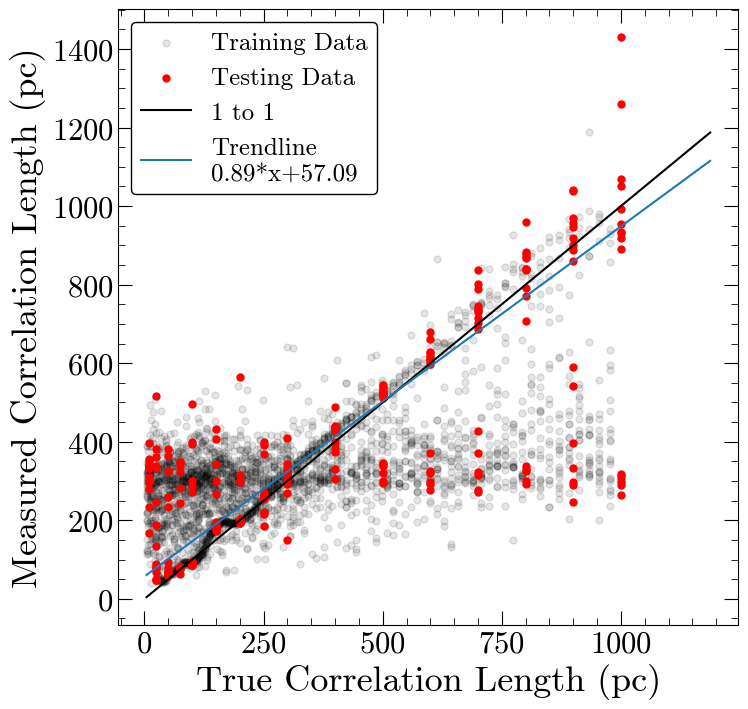

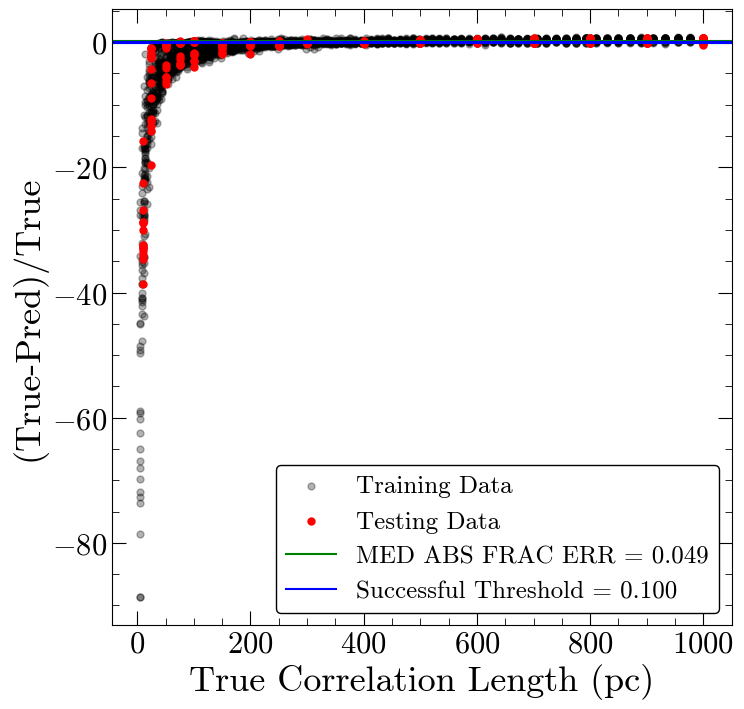

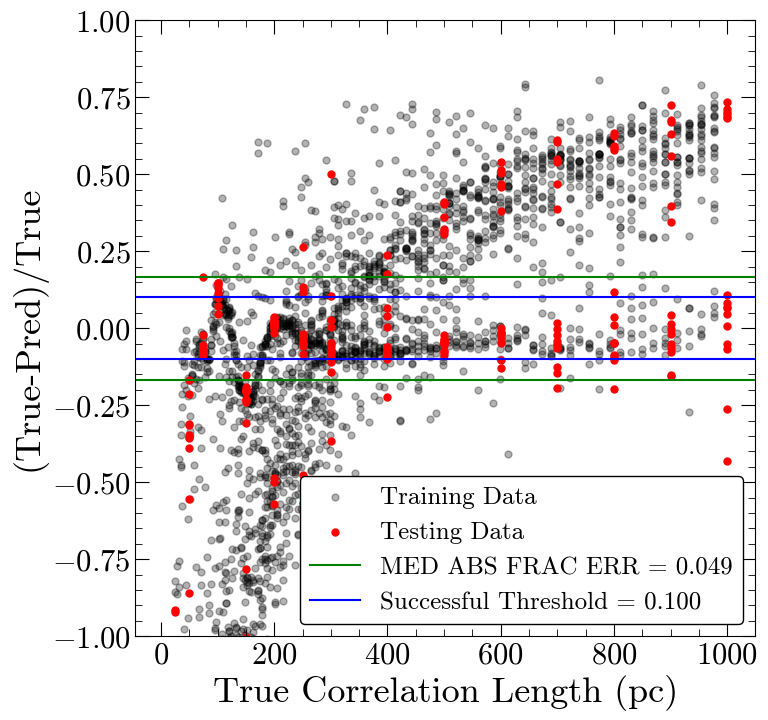

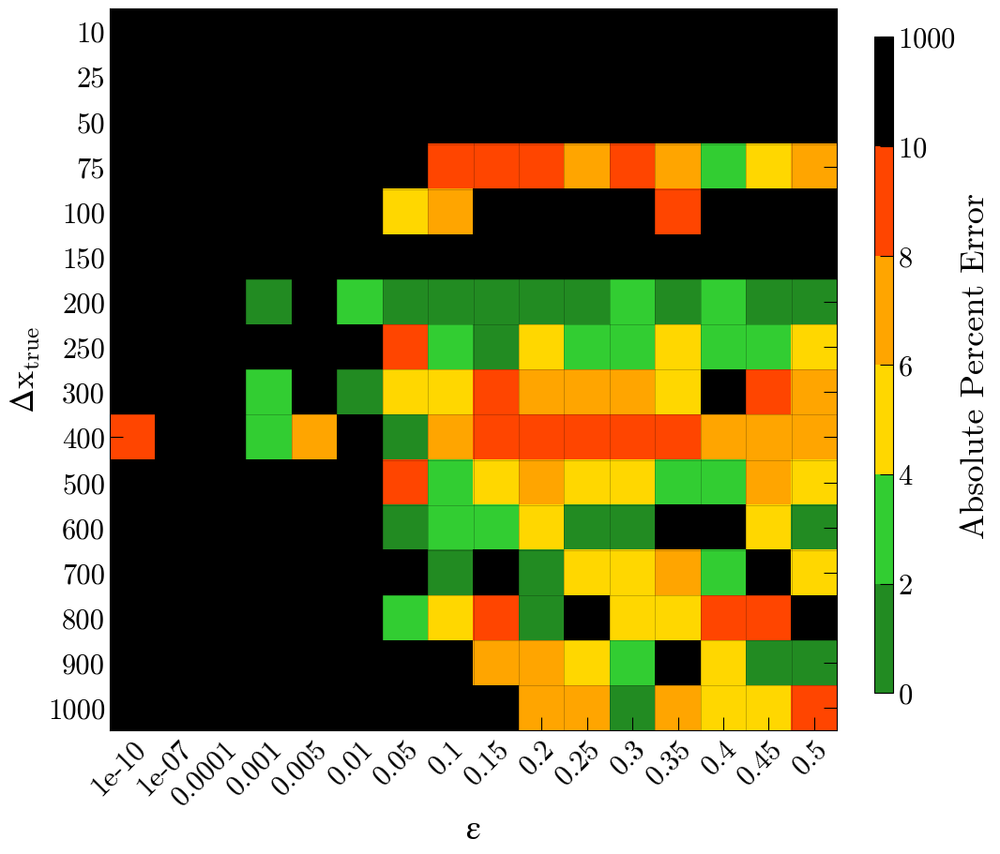

Number of squares with abs percent err>10%,  151


In [44]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [45]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model option is 8


Min MAE Training
8 , min val= 23.83

Max Frac Success Training
8 , max val= 0.49

Min MAE Testing
8 , min val= 29.07

Max Frac Success Testing
8 , max val= 0.53



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,151.25,0.22,53.76,0.47
1,153.43,0.20,42.32,0.49
2,162.10,0.18,79.65,0.39
3,138.86,0.17,106.38,0.26
4,142.07,0.10,66.07,0.19
5,160.80,0.19,47.78,0.38
6,118.24,0.16,60.83,0.31
7,95.17,0.27,37.30,0.46
8,23.83,0.49,29.07,0.53
9,47.50,0.38,38.66,0.44


In [47]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>121:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 1s 8ms/step - loss: 94491.1250
Epoch 2/400
92/92 [==============================] - 1s 8ms/step - loss: 65579.5391
Epoch 3/400
92/92 [==============================] - 1s 8ms/step - loss: 63168.3086
Epoch 4/400
92/92 [==============================] - 1s 10ms/step - loss: 59542.2344
Epoch 5/400
92/92 [==============================] - 1s 9ms/step - loss: 58384.4258
Epoch 6/400
92/92 [==============================] - 1s 14ms/step - loss: 57190.7812
Epoch 7/400
92/92 [==============================] - 1s 13ms/step - loss: 58033.4531
Epoch 8/400
92/92 [==============================] - 1s 11ms/step - loss: 57003.3203
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 57431.1875
Epoch 10/400
92/92 [==============================] - 1s 11ms/step - loss: 56809.0938
Epoch 11/400
92/92 [==============================] - 1s 9ms/step - loss: 56584.8281
Epoch 12/400
92/92 [==============================] - 1s 9ms/step - 

92/92 [==============================] - 1s 14ms/step - loss: 26487.9102
Epoch 191/400
92/92 [==============================] - 1s 15ms/step - loss: 26506.9258
Epoch 192/400
92/92 [==============================] - 2s 18ms/step - loss: 26470.6797
Epoch 193/400
92/92 [==============================] - 1s 15ms/step - loss: 25495.0059
Epoch 194/400
92/92 [==============================] - 2s 17ms/step - loss: 25052.7051
Epoch 195/400
92/92 [==============================] - 1s 15ms/step - loss: 24298.1777
Epoch 196/400
92/92 [==============================] - 2s 22ms/step - loss: 24007.8594
Epoch 197/400
92/92 [==============================] - 1s 11ms/step - loss: 24255.9258
Epoch 198/400
92/92 [==============================] - 1s 14ms/step - loss: 26113.2305
Epoch 199/400
92/92 [==============================] - 1s 12ms/step - loss: 26277.2031
Epoch 200/400
92/92 [==============================] - 1s 12ms/step - loss: 23392.6738
Epoch 201/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 14ms/step - loss: 5750.0864
Epoch 380/400
92/92 [==============================] - 1s 14ms/step - loss: 6448.6113
Epoch 381/400
92/92 [==============================] - 1s 15ms/step - loss: 7735.8354
Epoch 382/400
92/92 [==============================] - 1s 15ms/step - loss: 5789.8130
Epoch 383/400
92/92 [==============================] - 1s 15ms/step - loss: 5843.9219
Epoch 384/400
92/92 [==============================] - 1s 15ms/step - loss: 5483.7354
Epoch 385/400
92/92 [==============================] - 1s 14ms/step - loss: 5596.4639
Epoch 386/400
92/92 [==============================] - 1s 15ms/step - loss: 5259.5894
Epoch 387/400
92/92 [==============================] - 1s 14ms/step - loss: 5908.5308
Epoch 388/400
92/92 [==============================] - 1s 15ms/step - loss: 5435.1187
Epoch 389/400
92/92 [==============================] - 1s 14ms/step - loss: 5740.2803
Epoch 390/400
92/92 [==============================] - 1s 13ms/step 

In [48]:
#save the model
nb='06'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/06_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/06_final_model/assets


In [51]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

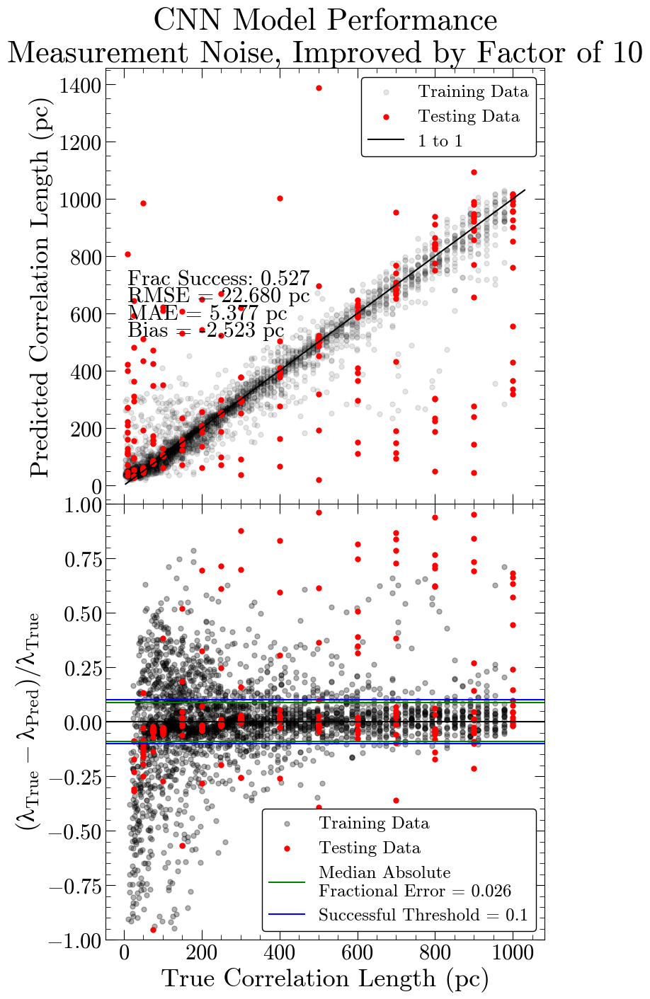

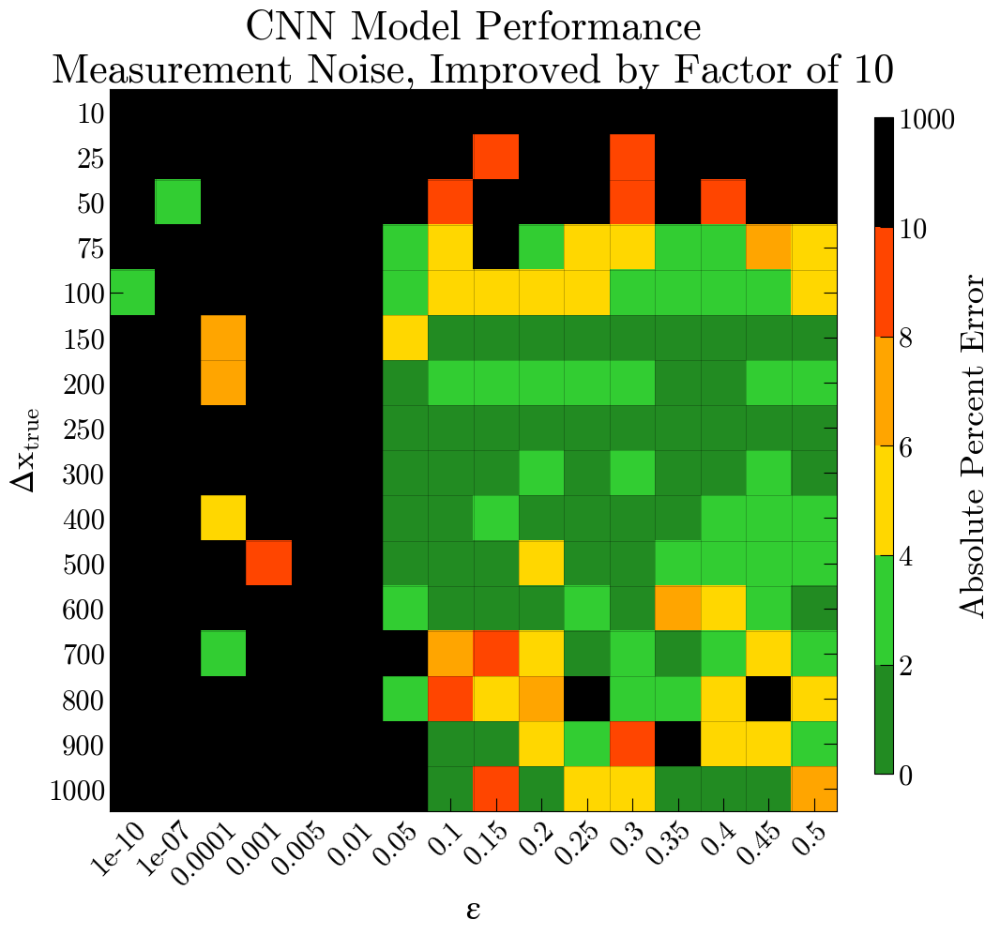

Number of squares with abs percent err>10%,  121


In [52]:
final_plot('06','CNN Model Performance\nMeasurement Noise, Improved by Factor of 10',statdy=60)